# **Social Network Analysis**

## Librerie necessarie

In [ ]:
# Installazione delle librerie necessarie
%pip install python-louvain
%pip install pandas
%pip install kagglehub
%pip install networkx
%pip install matplotlib
%pip install numpy
%pip install scipy
%pip install seaborn

^C
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [1]:
# Importazione delle librerie
import os
import pandas as pd
import kagglehub
import networkx as nx
import seaborn as sns
import ast
import re
import matplotlib.pyplot as plt
import numpy as np
from networkx.algorithms.community import greedy_modularity_communities
import itertools
from collections import defaultdict
from collections import Counter
from community import community_louvain
import warnings
warnings.filterwarnings('ignore')

## Caricamento ed esplorazione dataset

In [2]:
# Download latest version
path = kagglehub.dataset_download("jfreyberg/spotify-artist-feature-collaboration-network")

# Caricamento files
node_file = os.path.join(path, "nodes.csv") 
node_df = pd.read_csv(node_file)
print(f"nodes.csv: {node_df.shape[0]} artisti")

edge_file = os.path.join(path, "edges.csv") 
edge_df = pd.read_csv(edge_file)
print(f"edges.csv: {edge_df.shape[0]} collaborazioni")

display(node_df.head())
edge_df.head()

nodes.csv: 156422 artisti
edges.csv: 300386 collaborazioni


,spotify_id,name,followers,popularity,genres,chart_hits
0,48WvrUGoijadXXCsGocwM4,Byklubben,1738.0,24,"['nordic house', 'russelater']",['no (3)']
1,4lDiJcOJ2GLCK6p9q5BgfK,Kontra K,1999676.0,72,"['christlicher rap', 'german hip hop']","['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ..."
2,652XIvIBNGg3C0KIGEJWit,Maxim,34596.0,36,[],['de (1)']
3,3dXC1YPbnQPsfHPVkm1ipj,Christopher Martin,249233.0,52,"['dancehall', 'lovers rock', 'modern reggae', ...","['at (1)', 'de (1)']"
4,74terC9ol9zMo8rfzhSOiG,Jakob Hellman,21193.0,39,"['classic swedish pop', 'norrbotten indie', 's...",['se (6)']


,id_0,id_1
0,76M2Ekj8bG8W7X2nbx2CpF,7sfl4Xt5KmfyDs2T3SVSMK
1,0hk4xVujcyOr6USD95wcWb,7Do8se3ZoaVqUt3woqqSrD
2,38jpuy3yt3QIxQ8Fn1HTeJ,4csQIMQm6vI2A2SCVDuM2z
3,6PvcxssrQ0QaJVaBWHD07l,6UCQYrcJ6wab6gnQ89OJFh
4,2R1QrQqWuw3IjoP5dXRFjt,4mk1ScvOUkuQzzCZpT6bc0


In [3]:
# Analisi generale del dataset
print("=== STATISTICHE GENERALI ===")
print(f"Totale artisti: {len(node_df)}")
print(f"Totale collaborazioni: {len(edge_df)}")
print(f"\nArtisti con generi: {node_df['genres'].notna().sum()}")
print(f"Artisti senza generi: {node_df['genres'].isna().sum()}")

# Statistiche su followers e popularity
print(f"\n=== STATISTICHE FOLLOWERS ===")
print(f"Media followers: {node_df['followers'].mean():.0f}")
print(f"Mediana followers: {node_df['followers'].median():.0f}")
print(f"Max followers: {node_df['followers'].max():.0f}")

print(f"\n=== STATISTICHE POPULARITY ===")
print(f"Media popularity: {node_df['popularity'].mean():.2f}")
print(f"Mediana popularity: {node_df['popularity'].median():.2f}")
print(f"Max popularity: {node_df['popularity'].max():.0f}")

=== STATISTICHE GENERALI ===
Totale artisti: 156422
Totale collaborazioni: 300386

Artisti con generi: 156422
Artisti senza generi: 0

=== STATISTICHE FOLLOWERS ===
Media followers: 86224
Mediana followers: 363
Max followers: 102156853

=== STATISTICHE POPULARITY ===
Media popularity: 21.16
Mediana popularity: 18.00
Max popularity: 100


## Creazione e descrizione grafo

In [4]:
# Creiamo il grafo completo per calcolare il grado di ogni artista
G_full = nx.Graph()

# Aggiungiamo tutti i nodi
for idx, row in node_df.iterrows():
    G_full.add_node(row['spotify_id'], 
                    name=row['name'],
                    followers=row['followers'],
                    popularity=row['popularity'],
                    genres=row['genres'],
                    chart_hits=row['chart_hits']
                    )

# Aggiungiamo tutti gli archi (collaborazioni)
for idx, row in edge_df.iterrows():
    if G_full.has_node(row['id_0']) and G_full.has_node(row['id_1']):
        G_full.add_edge(row['id_0'], row['id_1'])

print(f"Grafo completo creato:")
print(f"- Nodi: {G_full.number_of_nodes()}")
print(f"- Archi: {G_full.number_of_edges()}")

Grafo completo creato:
- Nodi: 156320
- Archi: 300379


In [5]:
# Calcoliamo il grado (numero di collaborazioni) per ogni artista
degree_dict = dict(G_full.degree())

# Ordiniamo gli artisti per grado decrescente
sorted_artists = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)

# Selezioniamo i top 2000 artisti
TOP_N = 2000
top_artists_ids = [artist_id for artist_id, degree in sorted_artists[:TOP_N]]

print(f"\n=== TOP {TOP_N} ARTISTI PER COLLABORAZIONI ===")
print(f"Artisti selezionati: {len(top_artists_ids)}")
print(f"\nTop 10 artisti con più collaborazioni:")
for i, (artist_id, degree) in enumerate(sorted_artists[:10], 1):
    artist_name = G_full.nodes[artist_id]['name']
    print(f"{i}. {artist_name}: {degree} collaborazioni")


=== TOP 2000 ARTISTI PER COLLABORAZIONI ===
Artisti selezionati: 2000

Top 10 artisti con più collaborazioni:
1. Johann Sebastian Bach: 1781 collaborazioni
2. Traditional: 1371 collaborazioni
3. Mc Gw: 858 collaborazioni
4. MC MN: 632 collaborazioni
5. Jean Sibelius: 580 collaborazioni
6. Armin van Buuren: 513 collaborazioni
7. Gucci Mane: 509 collaborazioni
8. Steve Aoki: 498 collaborazioni
9. Snoop Dogg: 495 collaborazioni
10. Diplo: 494 collaborazioni


### Analisi della struttura del grafo

In [6]:
# Creiamo il sottografo con i top 2000 artisti
G_top = G_full.subgraph(top_artists_ids).copy()

print(f"\n=== GRAFO TOP {TOP_N} ARTISTI ===")
print(f"Nodi: {G_top.number_of_nodes()}")
print(f"Archi (collaborazioni): {G_top.number_of_edges()}")
print(f"Densità: {nx.density(G_top):.6f}")

# Verifichiamo la connettività
is_connected = nx.is_connected(G_top)
print(f"Grafo connesso: {is_connected}")


=== GRAFO TOP 2000 ARTISTI ===
Nodi: 2000
Archi (collaborazioni): 21760
Densità: 0.010885
Grafo connesso: False


In [7]:
# Analisi della struttura del grafo
print("=== ANALISI STRUTTURA DEL GRAFO ===\n")

# Statistiche sul sottografo dei top artisti
degrees = [d for n, d in G_top.degree()]
print(f"Grado medio: {np.mean(degrees):.2f}")
print(f"Grado mediano: {np.median(degrees):.2f}")
print(f"Grado minimo: {np.min(degrees)}")
print(f"Grado massimo: {np.max(degrees)}")

# Clustering coefficient
avg_clustering = nx.average_clustering(G_top)
print(f"\nClustering coefficient medio: {avg_clustering:.4f}")

# Statistiche su followers e popularity degli artisti selezionati
top_artists_data = node_df[node_df['spotify_id'].isin(top_artists_ids)]
print(f"\n=== STATISTICHE ARTISTI SELEZIONATI ===")
print(f"Media followers: {top_artists_data['followers'].mean():.0f}")
print(f"Media popularity: {top_artists_data['popularity'].mean():.2f}")

# Verifica connettività e calcolo distanze
print(f"\n=== CONNETTIVITÀ E DISTANZE ===")

# Verifica se il grafo è connesso
if nx.is_connected(G_top):
    # Se il grafo è connesso, calcola il diametro e la distanza media
    diameter = nx.diameter(G_top)
    print(f"Diametro della rete: {diameter}")

    avg_shortest_path_length = nx.average_shortest_path_length(G_top)
    print(f"Distanza media tra i nodi: {avg_shortest_path_length:.4f}")

else:
    # Se il grafo non è connesso, calcola per ogni componente connessa separatamente
    components = list(nx.connected_components(G_top))
    print(f"Numero di componenti connesse: {len(components)}")

    # Analizza solo le prime 5 componenti più grandi
    sorted_components = sorted(components, key=len, reverse=True)
    
    for i, component in enumerate(sorted_components[:5]):
        subgraph = G_top.subgraph(component)
        print(f"\n--- Componente {i+1} ---")
        print(f"Numero di nodi: {len(component)}")
        
        # Calcola il diametro per ogni componente
        if len(component) > 1:
            component_diameter = nx.diameter(subgraph)
            print(f"Diametro: {component_diameter}")
            
            # Calcola la distanza media per ogni componente
            component_avg_shortest_path_length = nx.average_shortest_path_length(subgraph)
            print(f"Distanza media: {component_avg_shortest_path_length:.4f}")
        else:
            print(f"Componente con un solo nodo, nessuna distanza da calcolare.")

=== ANALISI STRUTTURA DEL GRAFO ===

Grado medio: 21.76
Grado mediano: 16.00
Grado minimo: 0
Grado massimo: 153

Clustering coefficient medio: 0.2679

=== STATISTICHE ARTISTI SELEZIONATI ===
Media followers: 2270164
Media popularity: 59.70

=== CONNETTIVITÀ E DISTANZE ===
Numero di componenti connesse: 75

--- Componente 1 ---
Numero di nodi: 1917
Diametro: 10
Distanza media: 3.4861

--- Componente 2 ---
Numero di nodi: 3
Diametro: 2
Distanza media: 1.3333

--- Componente 3 ---
Numero di nodi: 2
Diametro: 1
Distanza media: 1.0000

--- Componente 4 ---
Numero di nodi: 2
Diametro: 1
Distanza media: 1.0000

--- Componente 5 ---
Numero di nodi: 2
Diametro: 1
Distanza media: 1.0000


### Rappresentazioni componente principale

Numero di nodi da visualizzare: 1917
Numero di archi da visualizzare: 21751


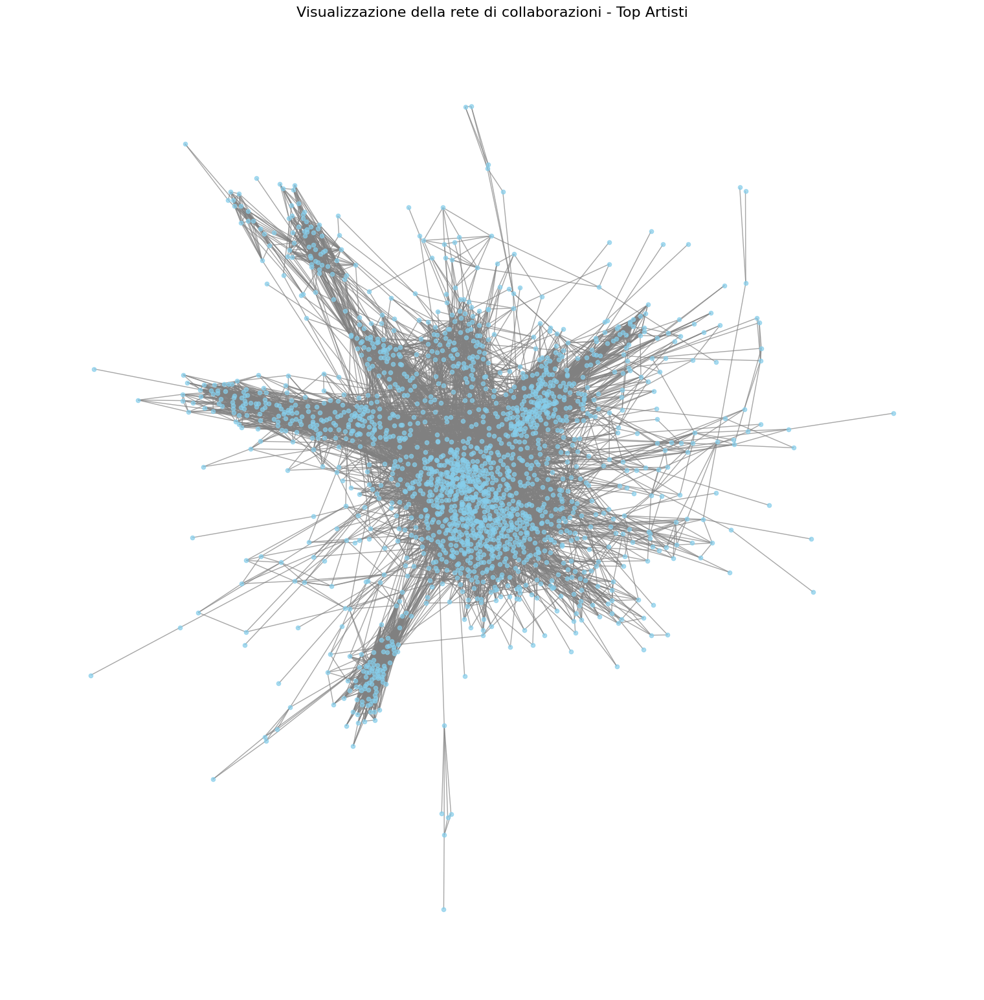

In [8]:
# Trova la componente connessa più grande
largest_cc = max(nx.connected_components(G_top), key=len)
G_top = G_top.subgraph(largest_cc).copy()

# Stampa informazioni sul grafo da visualizzare
print(f"Numero di nodi da visualizzare: {G_top.number_of_nodes()}")
print(f"Numero di archi da visualizzare: {G_top.number_of_edges()}")

# Visualizzazione base della rete
plt.figure(figsize=(15, 15))
nx.draw(G_top, node_size=20, edge_color='gray', with_labels=False, node_color='skyblue', alpha=0.7)
plt.title("Visualizzazione della rete di collaborazioni - Top Artisti", fontsize=16)
plt.tight_layout()
plt.show()

Creazione dei layout per la visualizzazione...
Layout calcolati, creazione visualizzazioni...


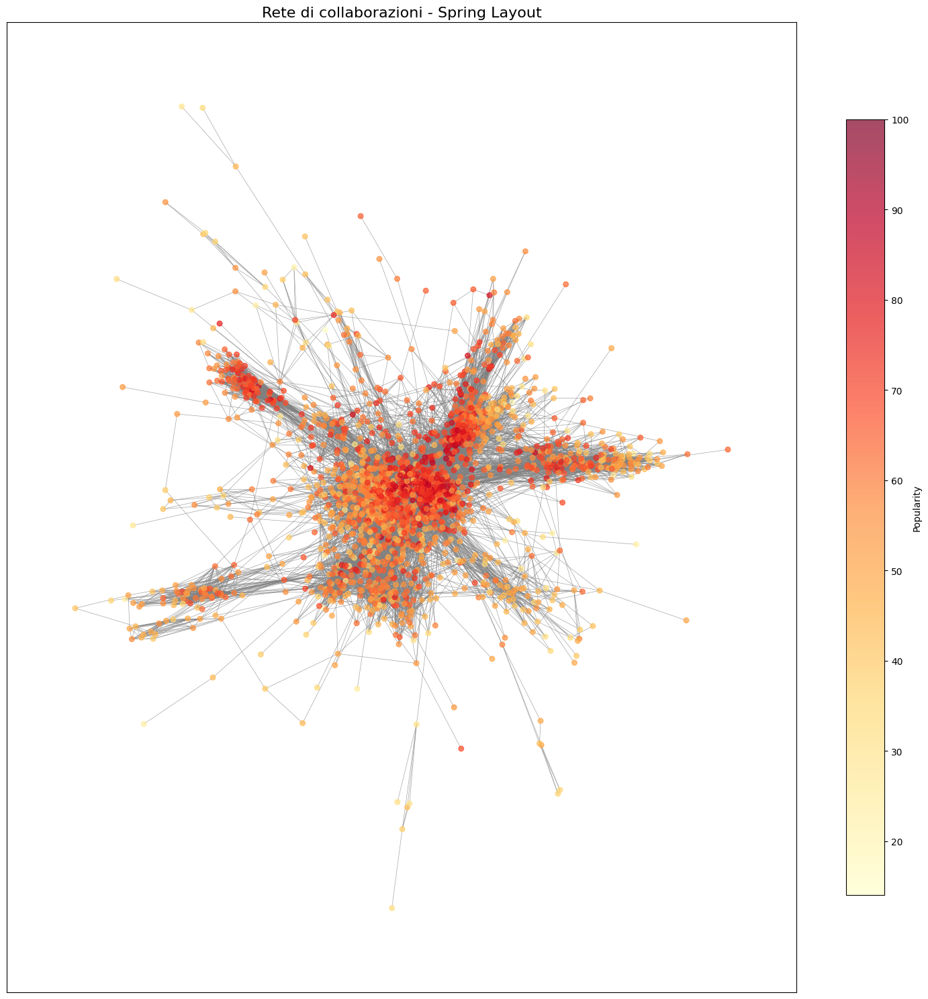

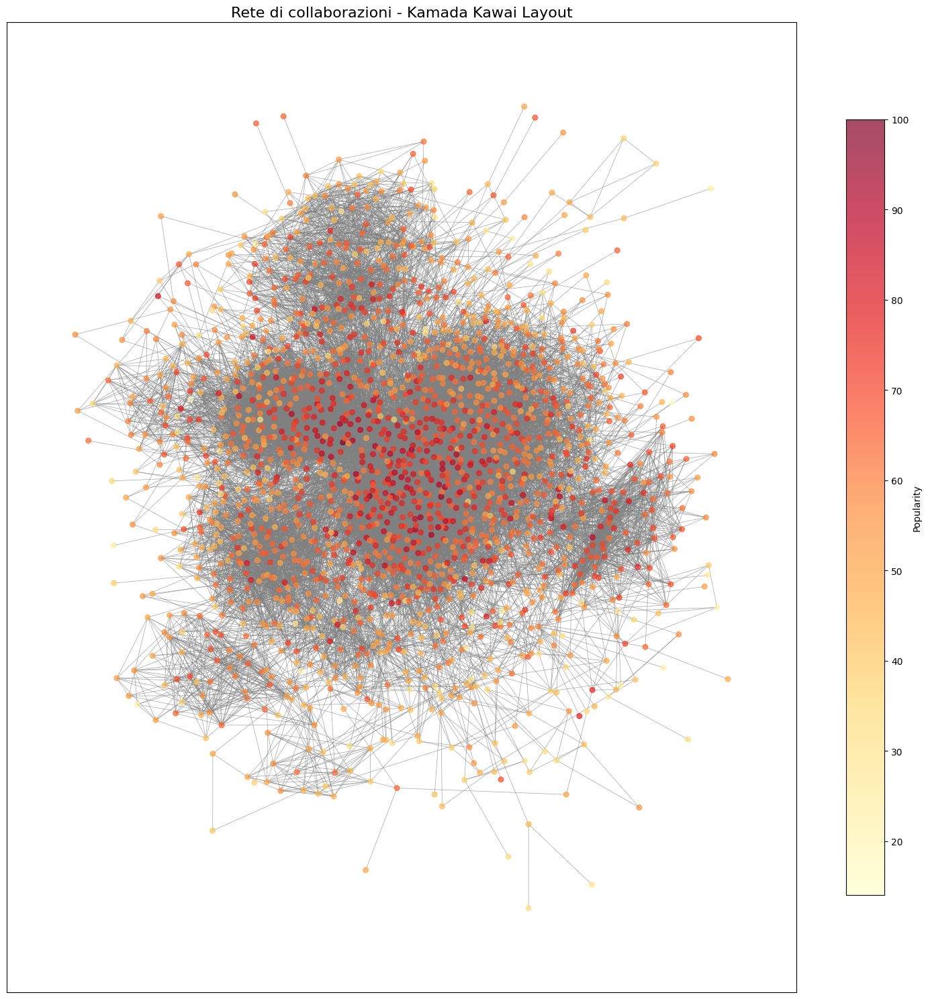

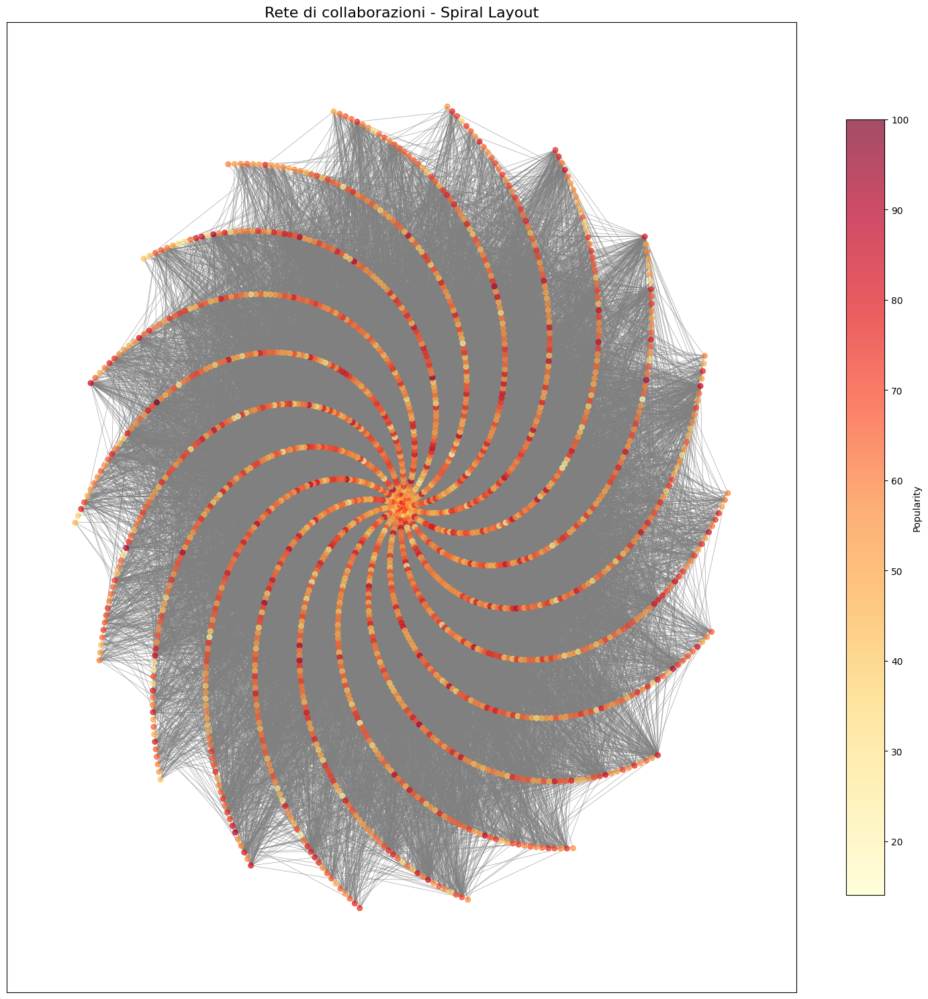

Visualizzazioni completate!


In [9]:
# Visualizzazioni con diversi layout
print("Creazione dei layout per la visualizzazione...")

# Calcoliamo i layout (questo può richiedere tempo con molti nodi)
layouts = {
    "Spring Layout": nx.spring_layout(G_top, k=0.5, iterations=50),
    "Kamada Kawai Layout": nx.kamada_kawai_layout(G_top),
    "Spiral Layout": nx.spiral_layout(G_top)
}

print("Layout calcolati, creazione visualizzazioni...")

# Visualizzazione con i diversi layout
for name, pos in layouts.items():
    plt.figure(figsize=(15, 15))
    
    # Coloriamo i nodi in base alla loro popolarità
    node_colors = [G_top.nodes[node]['popularity'] for node in G_top.nodes()]
    
    # Draw edges first
    nx.draw_networkx_edges(G_top, pos, edge_color='gray', alpha=0.7, width=0.5)
    # Draw nodes and get the mappable object
    nodes = nx.draw_networkx_nodes(
        G_top, pos,
        node_size=30,
        node_color=node_colors,
        cmap='YlOrRd',
        alpha=0.7
    )
    plt.title(f"Rete di collaborazioni - {name}", fontsize=16)
    plt.colorbar(nodes, label='Popularity', shrink=0.8)
    plt.tight_layout()
    plt.show()

print("Visualizzazioni completate!")

## Analisi delle centralità

Calcolo delle centralità...
- Degree centrality...
- Betweenness centrality...
- Closeness centrality...
- Eigenvector centrality...
Top 10 per DEGREE CENTRALITY:
  1. Farruko: 0.0799
  2. Ty Dolla $ign: 0.0783
  3. R3HAB: 0.0772
  4. Snoop Dogg: 0.0772
  5. French Montana: 0.0762
  6. David Guetta: 0.0705
  7. Steve Aoki: 0.0673
  8. Lil Wayne: 0.0673
  9. Tiësto: 0.0668
  10. J Balvin: 0.0647

Top 10 per BETWEENNESS CENTRALITY:
  1. R3HAB: 0.0428
  2. Diplo: 0.0363
  3. Snoop Dogg: 0.0339
  4. Major Lazer: 0.0282
  5. J Balvin: 0.0257
  6. Farruko: 0.0256
  7. French Montana: 0.0215
  8. Pitbull: 0.0212
  9. Steve Aoki: 0.0205
  10. Tiësto: 0.0201

Top 10 per CLOSENESS CENTRALITY:
  1. R3HAB: 0.4134
  2. Major Lazer: 0.4117
  3. Diplo: 0.4114
  4. J Balvin: 0.4114
  5. Sean Paul: 0.4106
  6. French Montana: 0.4071
  7. Snoop Dogg: 0.4058
  8. Tiësto: 0.4031
  9. David Guetta: 0.4018
  10. Steve Aoki: 0.3991

Top 10 per EIGENVECTOR CENTRALITY:
  1. Farruko: 0.1440
  1. Farruko: 0.1440

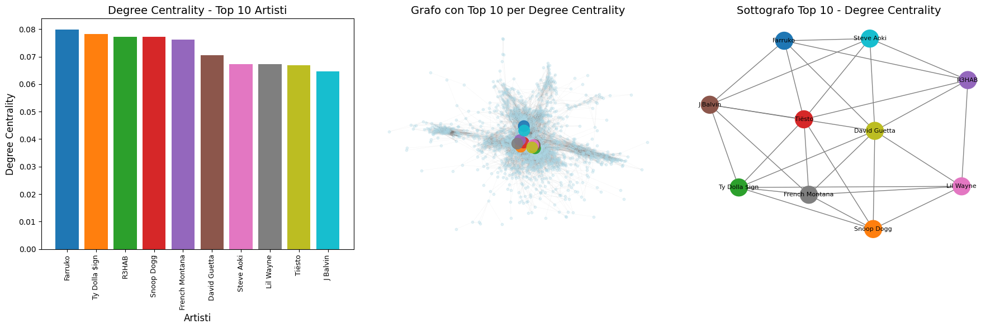

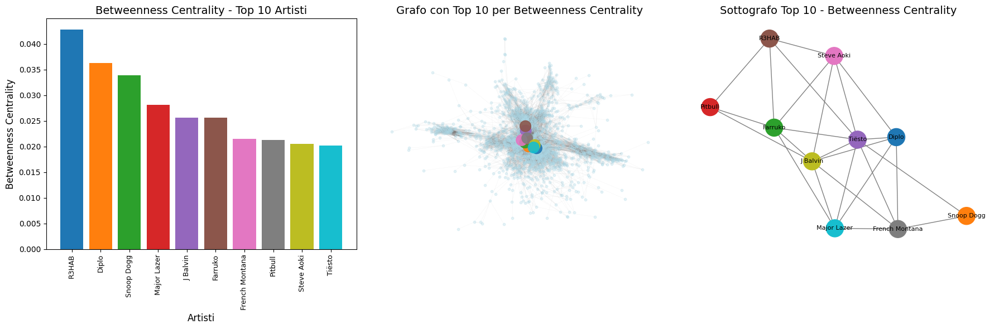

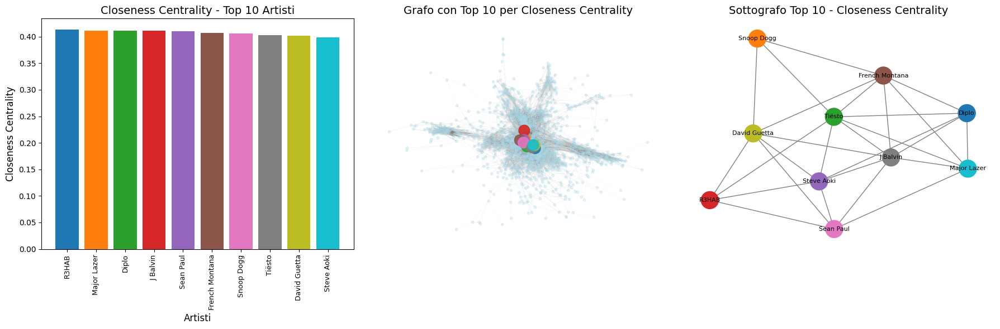

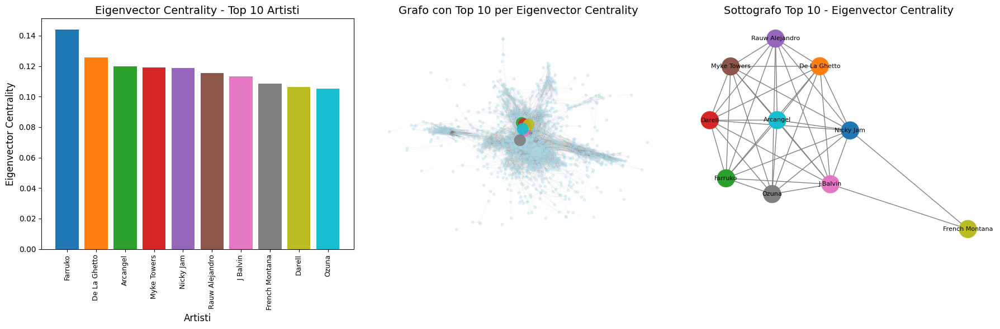

Visualizzazioni completate!


In [10]:
# Funzione per visualizzare i top nodi per centralità
def visualize_top_centrality(G, centrality_dict, top_nodes, centrality_name):
    """
    Visualizza i top nodi per una metrica di centralità con 3 grafici:
    1. Barplot dei valori di centralità
    2. Grafo completo con nodi top evidenziati
    3. Sottografo dei top 10 nodi
    """
    # Ordina i nodi
    top_nodes_sorted = sorted(top_nodes, key=lambda x: x[1], reverse=True)
    node_ids, values = zip(*top_nodes_sorted)
    
    # Ottieni i nomi degli artisti
    node_names = [G.nodes[node_id]['name'] for node_id in node_ids]
    
    # Colori per i nodi top
    color_palette = plt.cm.tab10.colors
    node_colors_map = {node_id: color_palette[i % len(color_palette)] for i, node_id in enumerate(node_ids)}
    
    plt.figure(figsize=(18, 6))
    
    # 1. Barplot
    plt.subplot(1, 3, 1)
    bar_colors = [node_colors_map[node_id] for node_id in node_ids]
    plt.bar(range(len(node_names)), values, color=bar_colors)
    plt.title(f"{centrality_name} - Top 10 Artisti", fontsize=14)
    plt.xlabel("Artisti", fontsize=12)
    plt.ylabel(f"{centrality_name}", fontsize=12)
    plt.xticks(range(len(node_names)), node_names, rotation=90, fontsize=9)
    
    # 2. Grafo completo con nodi top evidenziati
    plt.subplot(1, 3, 2)
    pos_full = nx.spring_layout(G, k=0.5, iterations=30, seed=42)
    
    # Disegna archi
    nx.draw_networkx_edges(G, pos_full, alpha=0.1, edge_color="gray", width=0.3)
    
    # Nodi non top
    non_top_nodes = [node for node in G.nodes() if node not in node_ids]
    nx.draw_networkx_nodes(G, pos_full, nodelist=non_top_nodes, 
                          node_color="lightblue", node_size=10, alpha=0.3)
    
    # Nodi top
    nx.draw_networkx_nodes(G, pos_full, nodelist=node_ids, 
                          node_color=[node_colors_map[node_id] for node_id in node_ids], 
                          node_size=200, alpha=0.9)
    
    plt.title(f"Grafo con Top 10 per {centrality_name}", fontsize=14)
    plt.axis('off')
    
    # 3. Sottografo dei top 10
    plt.subplot(1, 3, 3)
    subgraph = G.subgraph(node_ids)
    pos_sub = nx.spring_layout(subgraph, seed=42)
    
    # Crea labels con i nomi
    labels = {node_id: G.nodes[node_id]['name'] for node_id in node_ids}
    
    nx.draw(subgraph, pos=pos_sub, 
            labels=labels,
            node_size=500, 
            node_color=[node_colors_map[node_id] for node_id in node_ids], 
            font_size=8, 
            edge_color="gray",
            with_labels=True)
    
    plt.title(f"Sottografo Top 10 - {centrality_name}", fontsize=14)
    
    plt.tight_layout()
    plt.show()


# Calcola le metriche di centralità su G_top
print("Calcolo delle centralità...")
print("- Degree centrality...")
degree_centrality = nx.degree_centrality(G_top)

print("- Betweenness centrality...")
betweenness_centrality = nx.betweenness_centrality(G_top)

print("- Closeness centrality...")
closeness_centrality = nx.closeness_centrality(G_top)

print("- Eigenvector centrality...")
eigenvector_centrality = nx.eigenvector_centrality(G_top)

# Trova i top 10 per ogni metrica
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

# Stampa i top 10 con i nomi degli artisti
print("Top 10 per DEGREE CENTRALITY:")
for i, (artist_id, value) in enumerate(top_degree, 1):
    artist_name = G_top.nodes[artist_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")

print("\nTop 10 per BETWEENNESS CENTRALITY:")
for i, (artist_id, value) in enumerate(top_betweenness, 1):
    artist_name = G_top.nodes[artist_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")

print("\nTop 10 per CLOSENESS CENTRALITY:")
for i, (artist_id, value) in enumerate(top_closeness, 1):
    artist_name = G_top.nodes[artist_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")

print("\nTop 10 per EIGENVECTOR CENTRALITY:")
for i, (artist_id, value) in enumerate(top_eigenvector, 1):
    artist_name = G_top.nodes[artist_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")
    print(f"  {i}. {artist_name}: {value:.4f}")

print("\nVisualizzazione delle centralità...\n")

# Visualizza per ogni metrica
visualize_top_centrality(G_top, degree_centrality, top_degree, "Degree Centrality")
visualize_top_centrality(G_top, betweenness_centrality, top_betweenness, "Betweenness Centrality")
visualize_top_centrality(G_top, closeness_centrality, top_closeness, "Closeness Centrality")
visualize_top_centrality(G_top, eigenvector_centrality, top_eigenvector, "Eigenvector Centrality")

print("Visualizzazioni completate!")

### Grafichiamo la distribuzione delle centralità

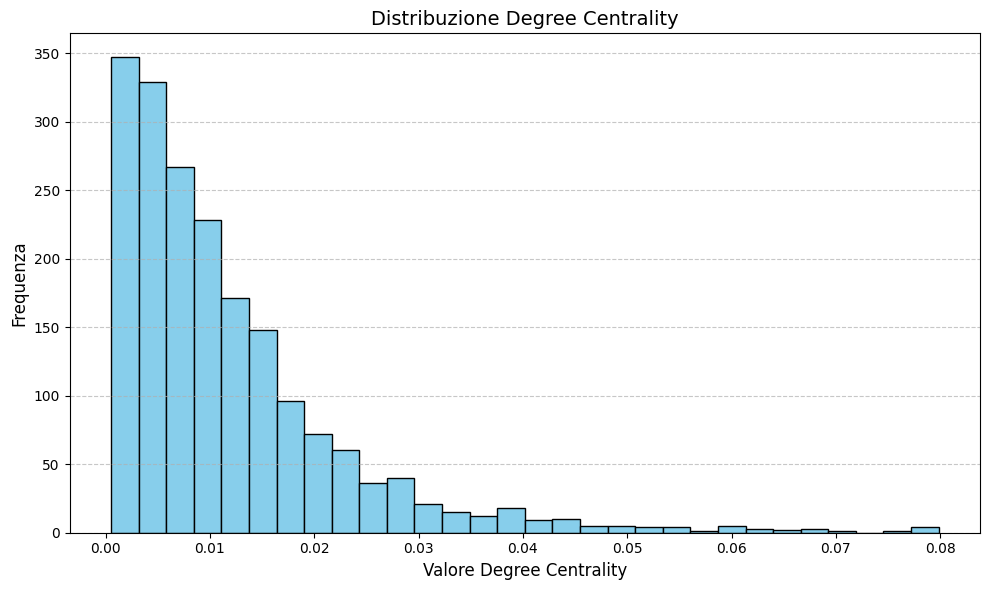

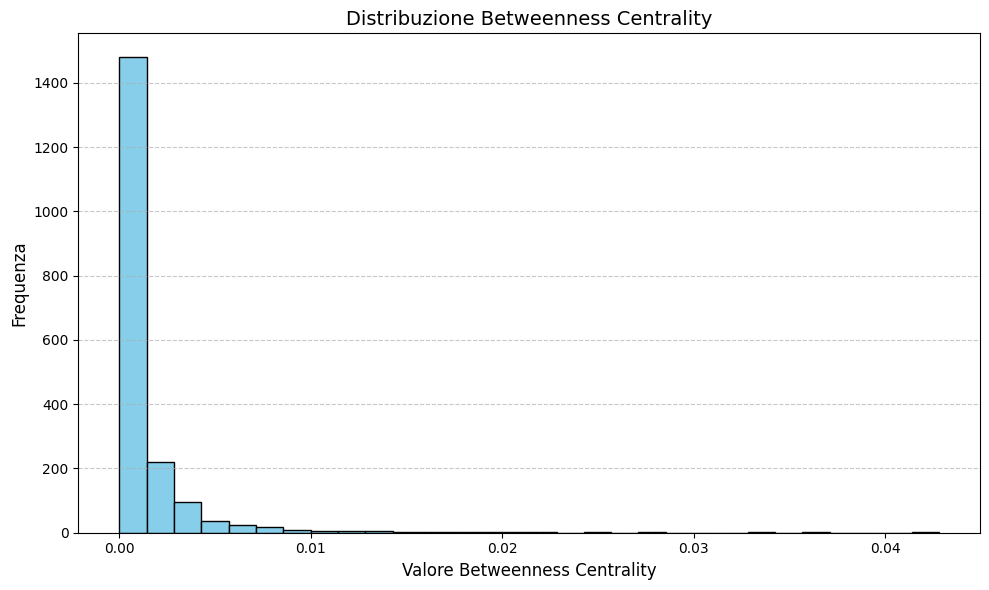

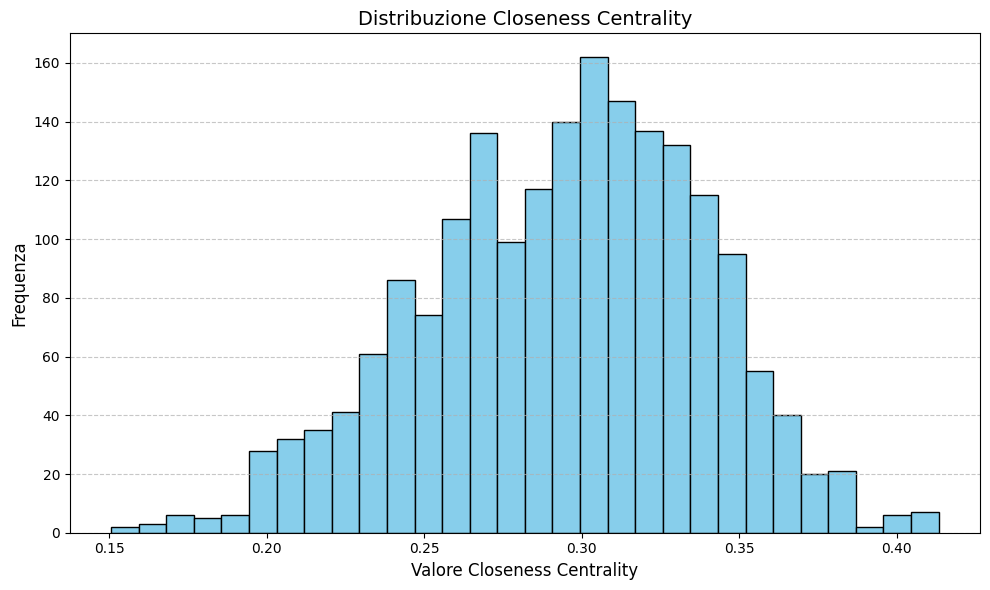

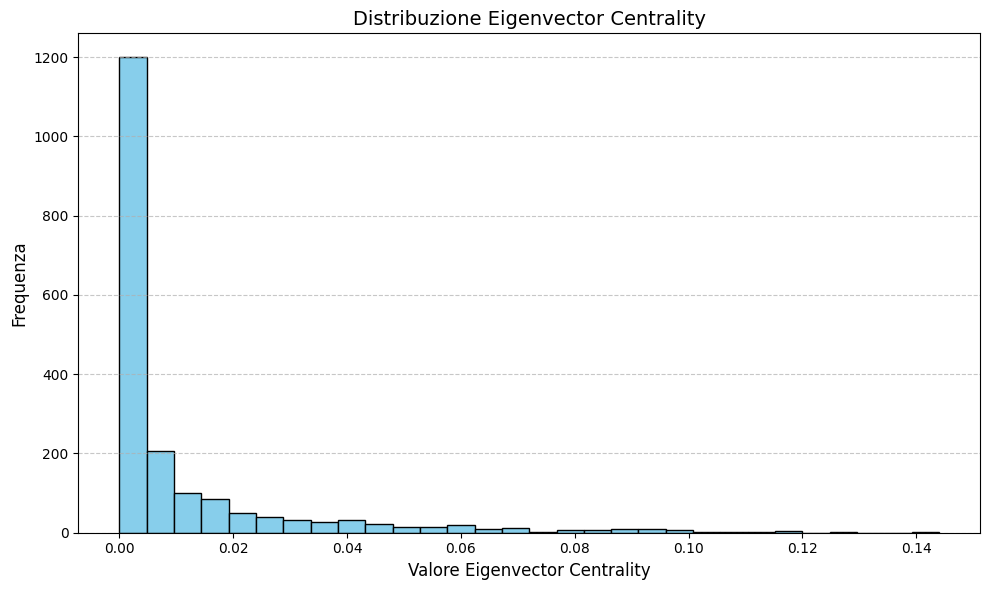

In [11]:
# Analisi della distribuzione delle centralità
# Creo un dizionario con tutte le metriche di centralità calcolate
centralities = {
    "Degree Centrality": degree_centrality,
    "Betweenness Centrality": betweenness_centrality,
    "Closeness Centrality": closeness_centrality,
    "Eigenvector Centrality": eigenvector_centrality
}

# Visualizzo la distribuzione dei valori per ciascuna metrica
for centrality_name, centrality_values in centralities.items():
    plt.figure(figsize=(10, 6))
    plt.hist(centrality_values.values(), bins=30, color="skyblue", edgecolor="black")
    plt.title(f"Distribuzione {centrality_name}", fontsize=14)
    plt.xlabel(f"Valore {centrality_name}", fontsize=12)
    plt.ylabel("Frequenza", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

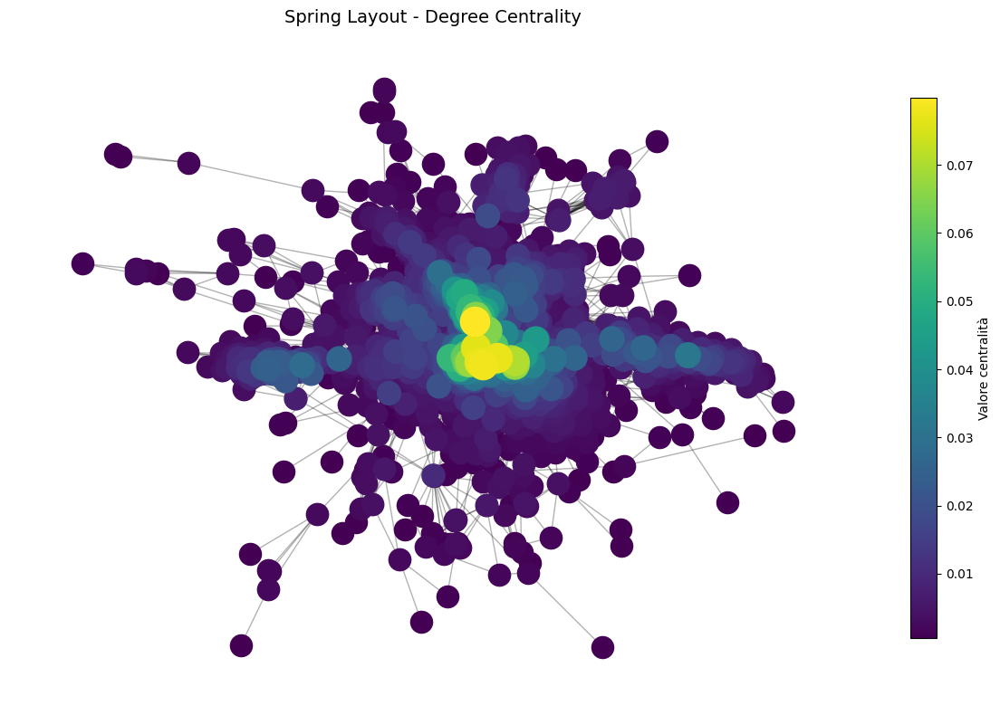

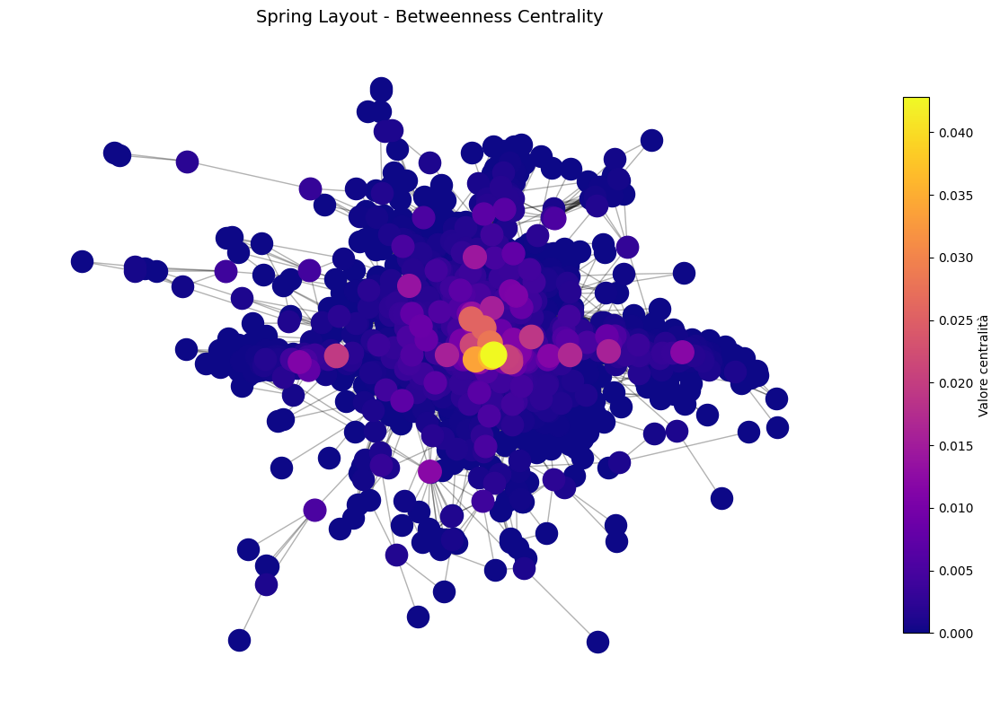

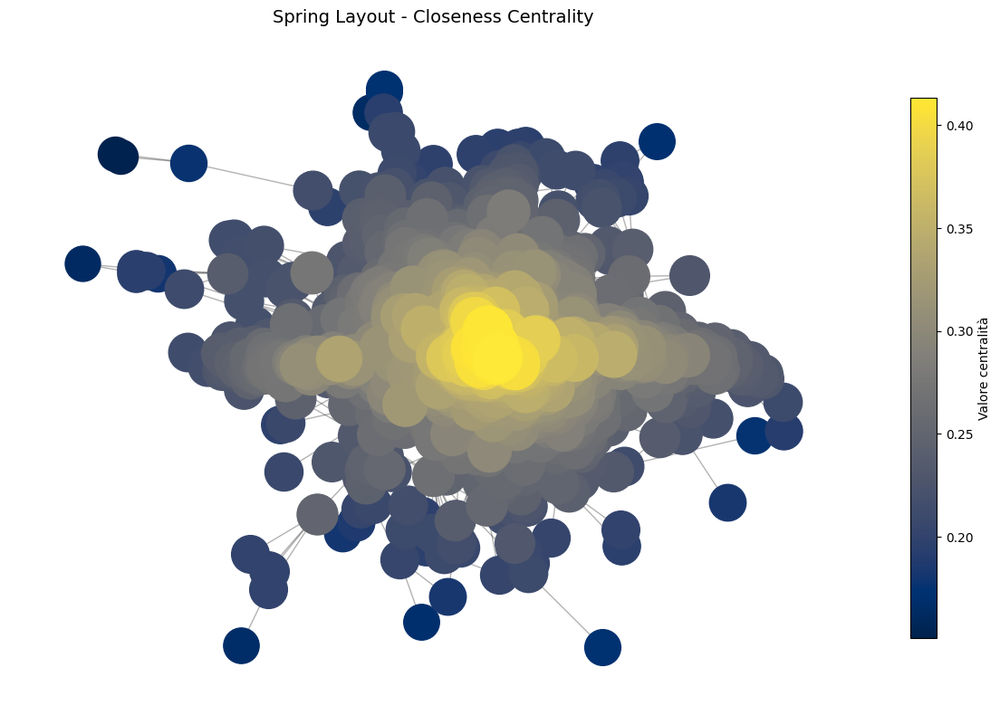

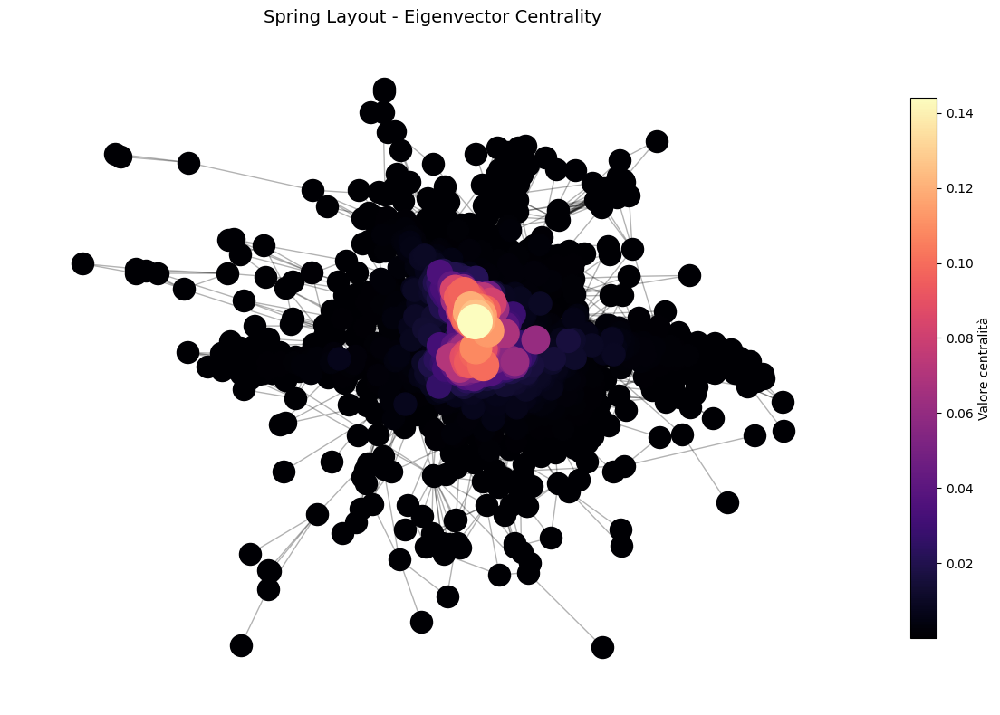

In [12]:
# Visualizzazione con Spring Layout e centralità
# Creo una funzione per visualizzare il grafo con nodi dimensionati in base alla centralità
def draw_spring_layout_highlight(centrality, title, cmap="viridis"):
    """
    Visualizza il grafo con Spring Layout evidenziando i nodi in base alla centralità.
    La dimensione dei nodi è proporzionale al valore di centralità.
    """
    pos = nx.spring_layout(G_top, seed=42)
    centrality_values = np.array(list(centrality.values()))
    
    # Ordino i nodi in base alla centralità per disegnare prima i meno importanti
    sorted_nodes = sorted(G_top.nodes(), key=lambda x: centrality[x])

    plt.figure(figsize=(12, 8))
    ax = plt.gca()
    
    # Disegno i nodi con dimensione proporzionale alla centralità
    for node in sorted_nodes:
        value = centrality[node]
        nx.draw_networkx_nodes(
            G_top, pos, nodelist=[node],
            node_size=300 + 3000 * value,
            node_color=[value],
            cmap=cmap,
            vmin=min(centrality_values), 
            vmax=max(centrality_values),
            ax=ax
        )

    # Disegno gli archi
    nx.draw_networkx_edges(G_top, pos, alpha=0.3, ax=ax)
    
    # Aggiungo la colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(centrality_values), vmax=max(centrality_values)))
    sm.set_array(centrality_values)
    plt.colorbar(sm, ax=ax, shrink=0.8, label="Valore centralità")
    plt.title(title, fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Applico la visualizzazione per ciascuna metrica di centralità
draw_spring_layout_highlight(degree_centrality, "Spring Layout - Degree Centrality", cmap="viridis")
draw_spring_layout_highlight(betweenness_centrality, "Spring Layout - Betweenness Centrality", cmap="plasma")
draw_spring_layout_highlight(closeness_centrality, "Spring Layout - Closeness Centrality", cmap="cividis")
draw_spring_layout_highlight(eigenvector_centrality, "Spring Layout - Eigenvector Centrality", cmap="magma")


## Analisi delle comunità

Numero di comunità rilevate: 12
Dimensioni delle comunità: [823, 484, 334, 95, 68, 39, 33, 25, 6, 5, 3, 2]


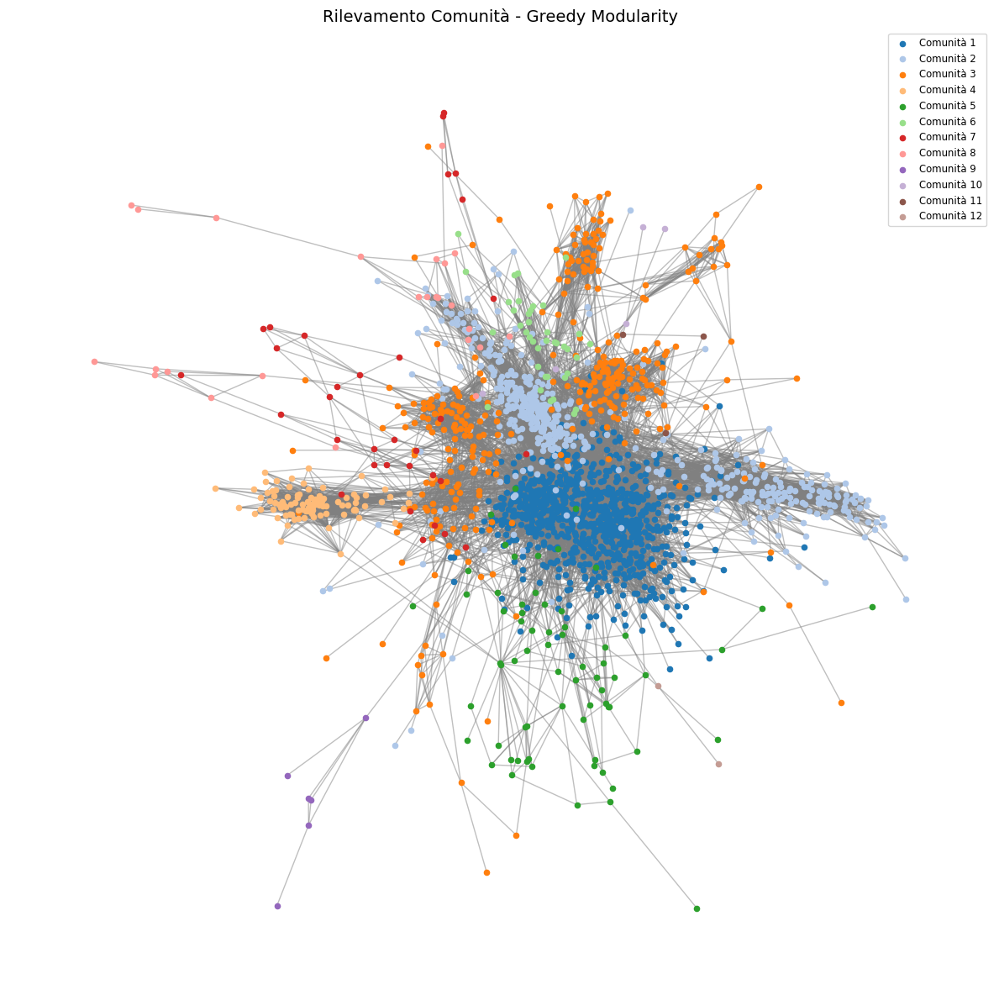

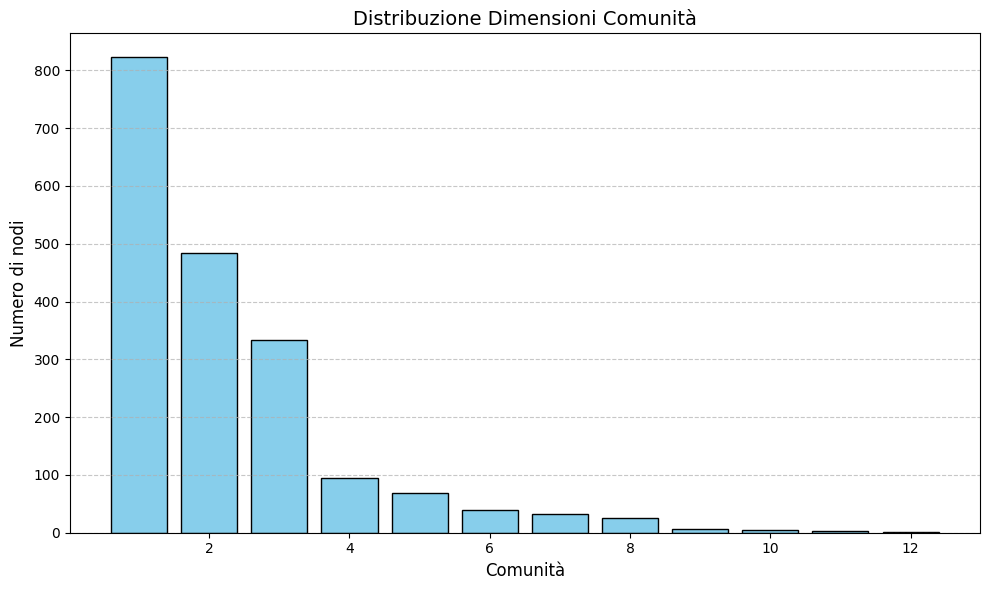

In [13]:
# Rilevamento delle comunità con algoritmo Greedy Modularity
communities = list(greedy_modularity_communities(G_top))

# Statistiche sulle comunità rilevate
print(f"Numero di comunità rilevate: {len(communities)}")
community_sizes = [len(c) for c in communities]
print(f"Dimensioni delle comunità: {community_sizes}")

# Visualizzazione delle comunità nel grafo
pos = nx.spring_layout(G_top, seed=42)
plt.figure(figsize=(12, 12))

# Assegno un colore diverso a ciascuna comunità
colors = itertools.cycle(plt.cm.tab20.colors)

for community, color in zip(communities, colors):
    nx.draw_networkx_nodes(
        G_top,
        pos,
        nodelist=list(community),
        node_size=20,
        node_color=[color],
        label=f"Comunità {communities.index(community) + 1}"
    )

nx.draw_networkx_edges(G_top, pos, alpha=0.5, edge_color='gray')
plt.title("Rilevamento Comunità - Greedy Modularity", fontsize=14)
plt.legend(loc="best", fontsize="small")
plt.axis('off')
plt.tight_layout()
plt.show()

# Analisi della distribuzione delle dimensioni delle comunità
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(community_sizes) + 1), community_sizes, color='skyblue', edgecolor='black')
plt.title("Distribuzione Dimensioni Comunità", fontsize=14)
plt.xlabel("Comunità", fontsize=12)
plt.ylabel("Numero di nodi", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


### Nodi Principali nelle Comunità

In [14]:
# Identificazione dei nodi principali in ciascuna comunità
# Per ogni comunità, calcolo la degree centrality e identifico i nodi più centrali
central_nodes_by_community = {}

for i, community in enumerate(communities):
    # Creo il sottografo della comunità
    subgraph = G_top.subgraph(community)
    community_degree_centrality = nx.degree_centrality(subgraph)
    sorted_nodes = sorted(community_degree_centrality.items(), key=lambda x: x[1], reverse=True)
    
    # Seleziono i primi 3 nodi più centrali della comunità
    central_nodes_by_community[f"Comunità {i+1}"] = sorted_nodes[:3]

# Stampo i nodi principali di ogni comunità con i relativi nomi degli artisti
print("=== NODI PRINCIPALI PER COMUNITÀ ===\n")
for community_name, nodes in central_nodes_by_community.items():
    print(f"{community_name}:")
    for node_id, centrality in nodes:
        artist_name = G_top.nodes[node_id]['name']
        print(f"  - {artist_name} (Degree Centrality: {centrality:.4f})")
    print()

=== NODI PRINCIPALI PER COMUNITÀ ===

Comunità 1:
  - Ty Dolla $ign (Degree Centrality: 0.1776)
  - R3HAB (Degree Centrality: 0.1582)
  - David Guetta (Degree Centrality: 0.1521)

Comunità 2:
  - Farruko (Degree Centrality: 0.2588)
  - De La Ghetto (Degree Centrality: 0.2215)
  - Arcangel (Degree Centrality: 0.2029)

Comunità 3:
  - Josylvio (Degree Centrality: 0.1261)
  - Jonna Fraser (Degree Centrality: 0.1231)
  - Chivv (Degree Centrality: 0.1201)

Comunità 4:
  - Pritam (Degree Centrality: 0.5532)
  - Arijit Singh (Degree Centrality: 0.5000)
  - Shreya Ghoshal (Degree Centrality: 0.4894)

Comunità 5:
  - Traditional (Degree Centrality: 0.2388)
  - Stress (Degree Centrality: 0.1343)
  - Tony Bennett (Degree Centrality: 0.1194)

Comunità 6:
  - Focalistic (Degree Centrality: 0.5526)
  - Kabza De Small (Degree Centrality: 0.5263)
  - Lady Du (Degree Centrality: 0.4474)

Comunità 7:
  - Connect-R (Degree Centrality: 0.3125)
  - Nane (Degree Centrality: 0.3125)
  - Killa Fonic (Degree C

### Identifico i ponti

Numero di ponti tra comunità: 1613
Percentuale di archi ponte: 7.42%


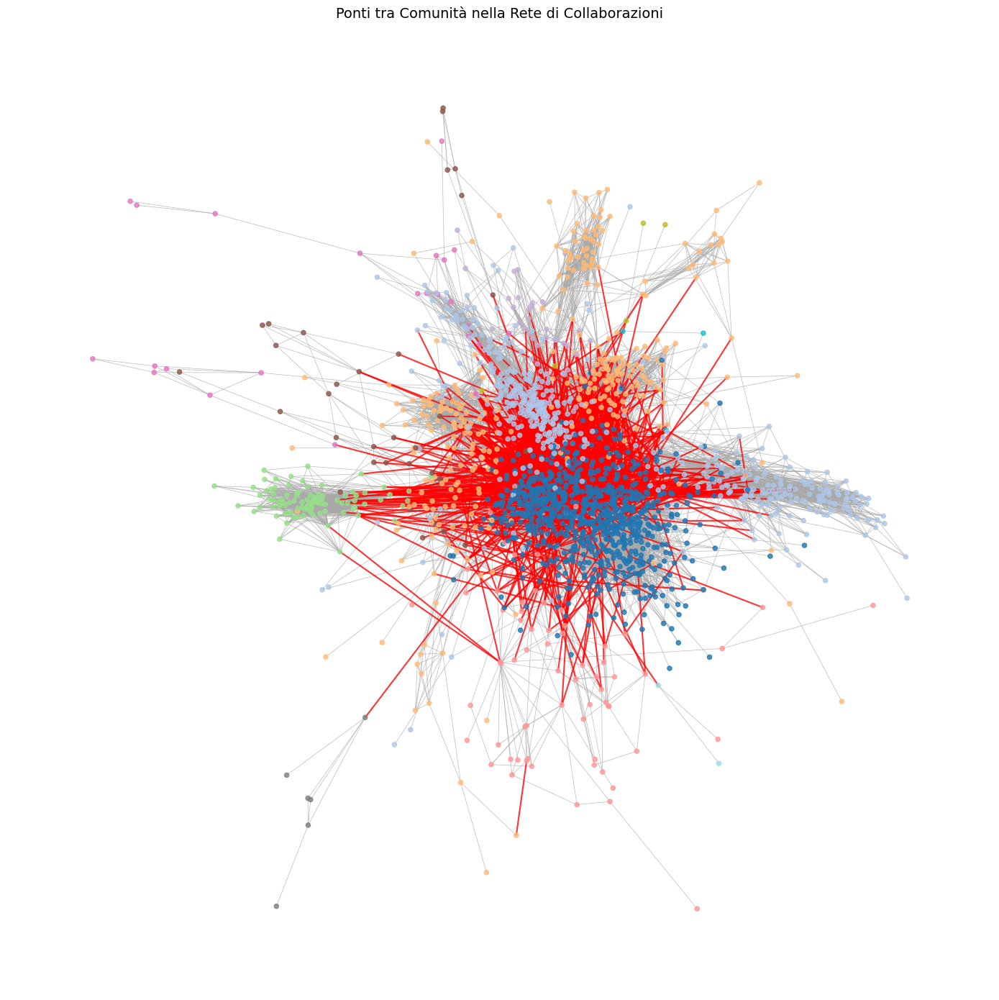

In [15]:
# Analisi dei ponti tra comunità
# Creo una mappatura tra nodi e comunità di appartenenza
community_labels = {}
for i, community in enumerate(communities):
    for node in community:
        community_labels[node] = i

# Organizzo i nodi per comunità
community_nodes = defaultdict(list)
for node, comm in community_labels.items():
    community_nodes[comm].append(node)

# Identifico gli archi ponte che collegano comunità diverse
bridges = []
for u, v in G_top.edges():
    if community_labels[u] != community_labels[v]:
        bridges.append((u, v))

print(f"Numero di ponti tra comunità: {len(bridges)}")
print(f"Percentuale di archi ponte: {len(bridges)/G_top.number_of_edges()*100:.2f}%")

# Visualizzazione dei ponti tra comunità
plt.figure(figsize=(14, 14))
pos = nx.spring_layout(G_top, seed=42)

# Coloro i nodi in base alla comunità di appartenenza
node_colors = [community_labels[node] for node in G_top.nodes()]
nx.draw_networkx_nodes(G_top, pos, node_color=node_colors, cmap=plt.cm.tab20, node_size=20, alpha=0.8)

# Disegno gli archi interni alle comunità
same_comm_edges = [(u, v) for u, v in G_top.edges() if community_labels[u] == community_labels[v]]
nx.draw_networkx_edges(G_top, pos, edgelist=same_comm_edges, edge_color="darkgray", alpha=0.8, width=0.5)

# Evidenzio i ponti tra comunità
nx.draw_networkx_edges(G_top, pos, edgelist=bridges, edge_color="red", alpha=0.8, width=1.5)

plt.title("Ponti tra Comunità nella Rete di Collaborazioni", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()

Analizzo quali artisti sono coinvolti nei ponti e calcolo le loro centralità per verificare se i nodi ponte sono anche i più centrali della rete.


=== ARTISTI COINVOLTI NEI PONTI ===
Numero di artisti nei ponti: 868
Percentuale sul totale: 45.28%

Top 10 artisti nei ponti per Degree Centrality:
  1. Farruko: 0.0799
  2. Ty Dolla $ign: 0.0783
  3. R3HAB: 0.0772
  4. Snoop Dogg: 0.0772
  5. French Montana: 0.0762
  6. David Guetta: 0.0705
  7. Steve Aoki: 0.0673
  8. Lil Wayne: 0.0673
  9. Tiësto: 0.0668
  10. De La Ghetto: 0.0647

Top 10 artisti nei ponti per Betweenness Centrality:
  1. R3HAB: 0.0428
  2. Diplo: 0.0363
  3. Snoop Dogg: 0.0339
  4. Major Lazer: 0.0282
  5. J Balvin: 0.0257
  6. Farruko: 0.0256
  7. French Montana: 0.0215
  8. Pitbull: 0.0212
  9. Steve Aoki: 0.0205
  10. Tiësto: 0.0201

Top 10 artisti nei ponti per Closeness Centrality:
  1. R3HAB: 0.4134
  2. Major Lazer: 0.4117
  3. Diplo: 0.4114
  4. J Balvin: 0.4114
  5. Sean Paul: 0.4106
  6. French Montana: 0.4071
  7. Snoop Dogg: 0.4058
  8. Tiësto: 0.4031
  9. David Guetta: 0.4018
  10. Steve Aoki: 0.3991


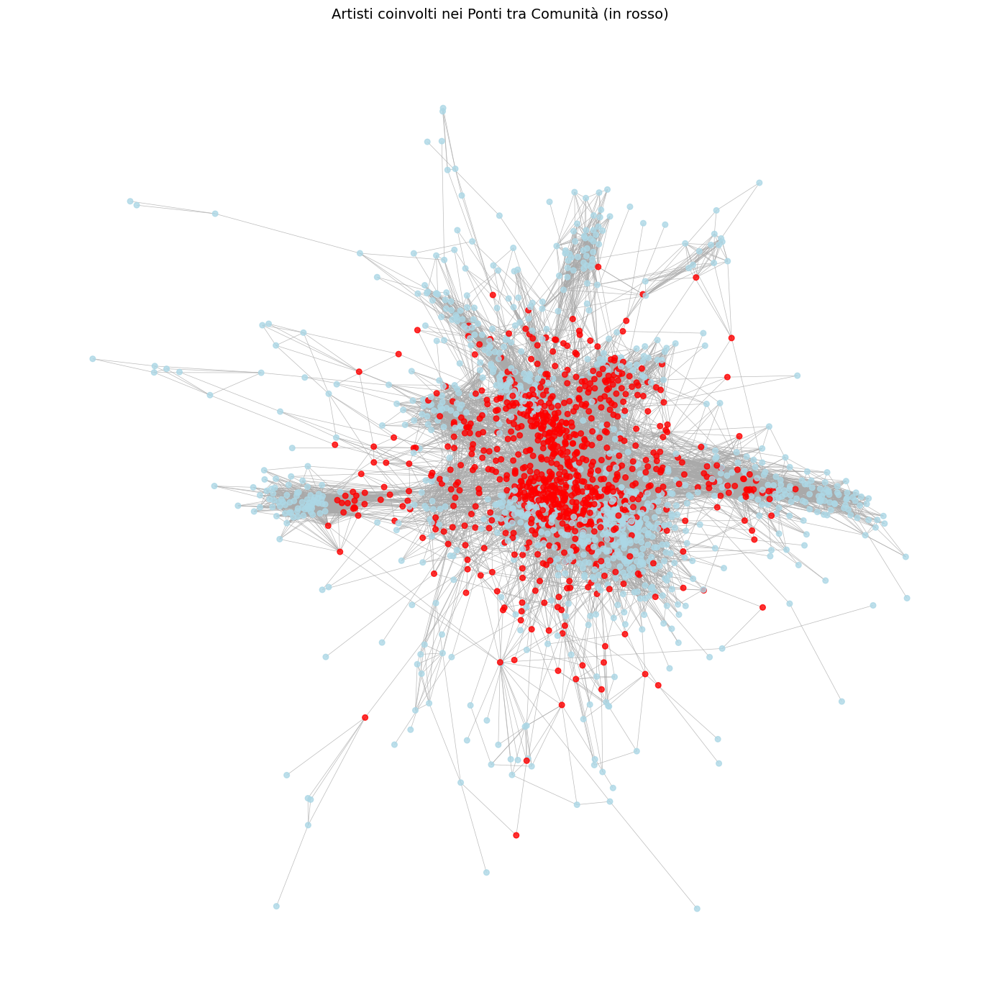

In [ ]:
# Analisi degli artisti coinvolti nei ponti tra comunità
# Identifico tutti i nodi che partecipano agli archi ponte
nodes_in_bridges = set()
for u, v in bridges:
    nodes_in_bridges.add(u)
    nodes_in_bridges.add(v)

print(f"\n=== ARTISTI COINVOLTI NEI PONTI ===")
print(f"Numero di artisti nei ponti: {len(nodes_in_bridges)}")
print(f"Percentuale sul totale: {len(nodes_in_bridges)/G_top.number_of_nodes()*100:.2f}%")

# Calcolo le centralità per i nodi coinvolti nei ponti
bridge_degree_centrality = {node: degree_centrality[node] for node in nodes_in_bridges}
bridge_betweenness_centrality = {node: betweenness_centrality[node] for node in nodes_in_bridges}
bridge_closeness_centrality = {node: closeness_centrality[node] for node in nodes_in_bridges}

# Identifico i top 10 artisti per ciascuna metrica di centralità tra i nodi ponte
top_bridge_by_degree = sorted(bridge_degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_bridge_by_betweenness = sorted(bridge_betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_bridge_by_closeness = sorted(bridge_closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

# Stampo i risultati con i nomi degli artisti
print("\nTop 10 artisti nei ponti per Degree Centrality:")
for i, (node_id, value) in enumerate(top_bridge_by_degree, 1):
    artist_name = G_top.nodes[node_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")

print("\nTop 10 artisti nei ponti per Betweenness Centrality:")
for i, (node_id, value) in enumerate(top_bridge_by_betweenness, 1):
    artist_name = G_top.nodes[node_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")

print("\nTop 10 artisti nei ponti per Closeness Centrality:")
for i, (node_id, value) in enumerate(top_bridge_by_closeness, 1):
    artist_name = G_top.nodes[node_id]['name']
    print(f"  {i}. {artist_name}: {value:.4f}")

## Analisi ego-network

- R3HAB - Super-connettore globale (Betweenness e Closeness dominanti)
- Farruko - Leader della comunità Latin urban (Degree ed Eigenvector alti)
- Ty Dolla $ign - Leader della comunità mainstream crossover

=== EGO NETWORK DI R3HAB ===
Numero di nodi: 149
Numero di archi: 959
Densità: 0.0870

Top 5 collaboratori di R3HAB:
  1. David Guetta (Degree Centrality: 0.3243)
  2. Tiësto (Degree Centrality: 0.3108)
  3. Steve Aoki (Degree Centrality: 0.2838)
  4. Afrojack (Degree Centrality: 0.2230)
  5. Hardwell (Degree Centrality: 0.2095)



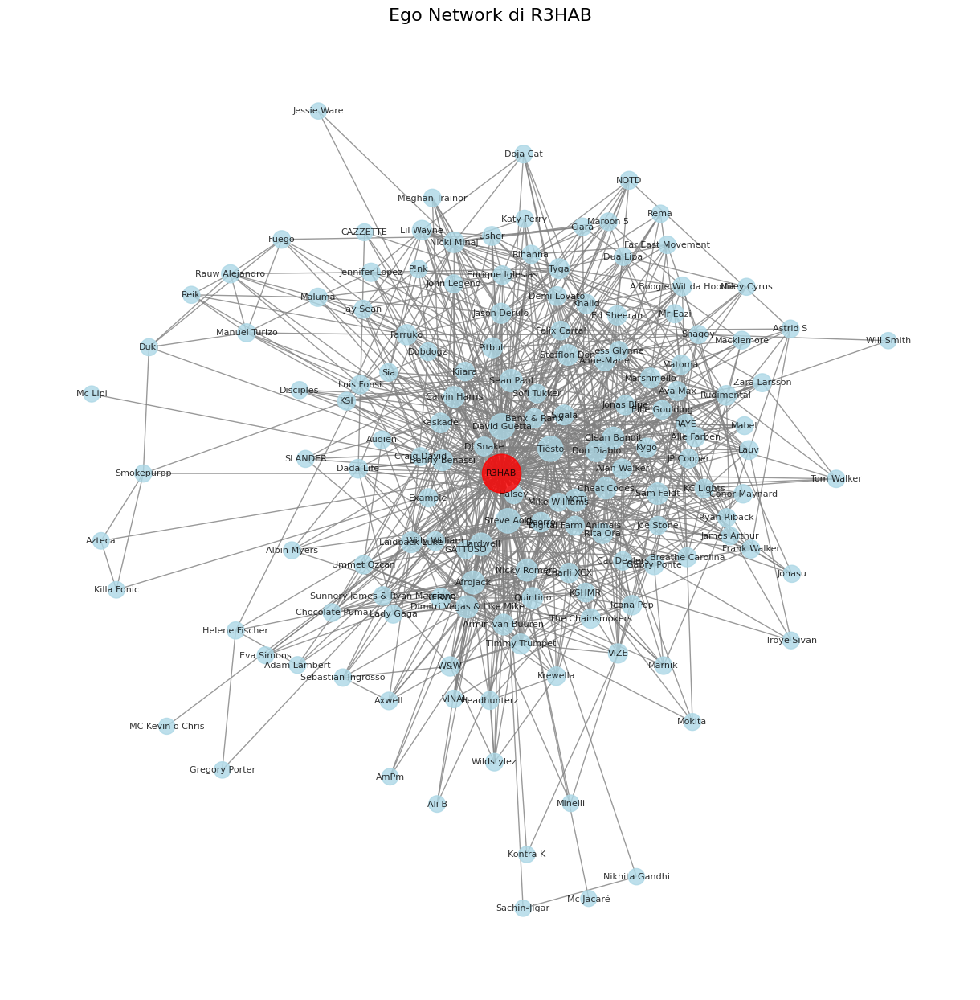



=== EGO NETWORK DI Farruko ===
Numero di nodi: 154
Numero di archi: 2436
Densità: 0.2068

Top 5 collaboratori di Farruko:
  1. De La Ghetto (Degree Centrality: 0.5621)
  2. Nicky Jam (Degree Centrality: 0.5556)
  3. Arcangel (Degree Centrality: 0.5294)
  4. Myke Towers (Degree Centrality: 0.4837)
  5. Darell (Degree Centrality: 0.4641)



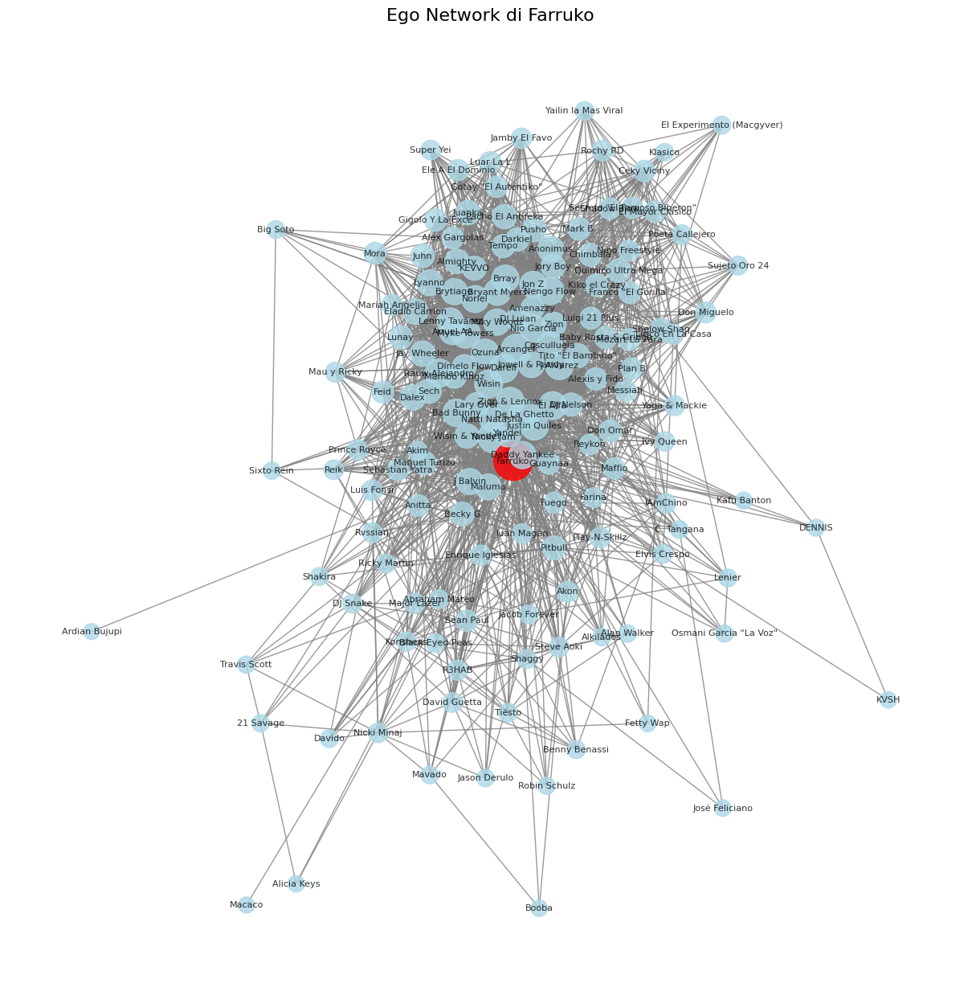



=== EGO NETWORK DI Ty Dolla $ign ===
Numero di nodi: 151
Numero di archi: 1934
Densità: 0.1708

Top 5 collaboratori di Ty Dolla $ign:
  1. 2 Chainz (Degree Centrality: 0.5000)
  2. Chris Brown (Degree Centrality: 0.4600)
  3. French Montana (Degree Centrality: 0.4533)
  4. Future (Degree Centrality: 0.4467)
  5. Wiz Khalifa (Degree Centrality: 0.4400)



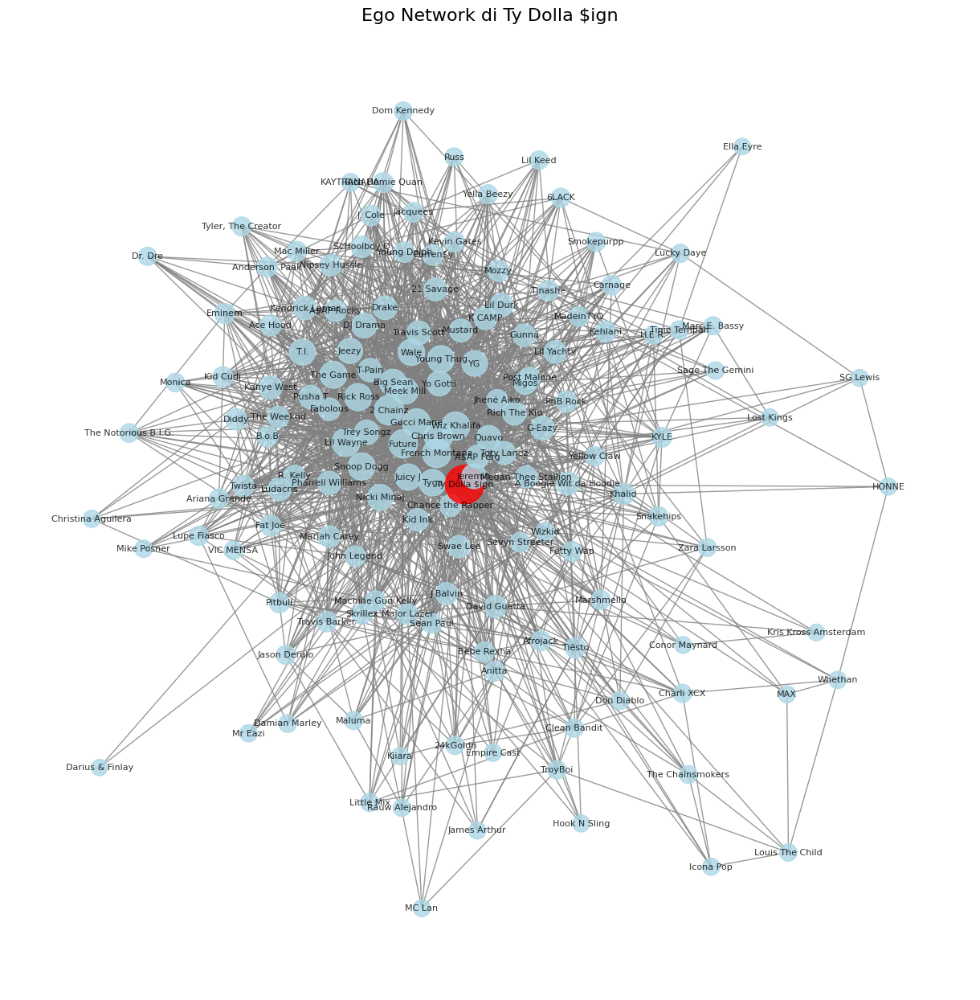

In [28]:
# Funzione migliorata per analizzare e visualizzare una ego network
def analyze_ego_network_improved(G, central_node_name, radius=1):
    """
    Analizza e visualizza la ego network di un artista specifico.
    
    Parametri:
    - G: grafo NetworkX
    - central_node_name: nome dell'artista centrale
    - radius: raggio della ego network (default=1)
    """
    # Trova il nodo ID corrispondente al nome dell'artista
    central_node_id = None
    for node_id in G.nodes():
        if G.nodes[node_id]['name'] == central_node_name:
            central_node_id = node_id
            break
    
    if central_node_id is None:
        print(f"Artista '{central_node_name}' non trovato nel grafo.")
        return
    
    # Costruzione della ego network
    ego_net = nx.ego_graph(G, central_node_id, radius=radius)
    
    # Calcolo delle metriche locali
    ego_degree_centrality = nx.degree_centrality(ego_net)
    num_nodes = ego_net.number_of_nodes()
    num_edges = ego_net.number_of_edges()
    density = nx.density(ego_net)
    
    print(f"=== EGO NETWORK DI {central_node_name} ===")
    print(f"Numero di nodi: {num_nodes}")
    print(f"Numero di archi: {num_edges}")
    print(f"Densità: {density:.4f}\n")
    
    # Identifica i top 5 collaboratori per degree centrality
    sorted_nodes = sorted(ego_degree_centrality.items(), key=lambda x: x[1], reverse=True)
    top_collaborators = [node for node, cent in sorted_nodes if node != central_node_id][:5]
    
    print(f"Top 5 collaboratori di {central_node_name}:")
    for i, node_id in enumerate(top_collaborators, 1):
        collaborator_name = G.nodes[node_id]['name']
        centrality_value = ego_degree_centrality[node_id]
        print(f"  {i}. {collaborator_name} (Degree Centrality: {centrality_value:.4f})")
    print()
    
    # Calcolo della dimensione e del colore dei nodi
    node_sizes = [200 + 1000 * ego_degree_centrality[node] for node in ego_net.nodes]
    node_colors = ['red' if node == central_node_id else 'lightblue' for node in ego_net.nodes]
    
    # Visualizzazione migliorata della ego network
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(ego_net, seed=42)
    
    # Crea labels con i nomi degli artisti
    labels = {node_id: G.nodes[node_id]['name'] for node_id in ego_net.nodes}
    
    nx.draw(
        ego_net, pos,
        with_labels=True,
        labels=labels,
        node_color=node_colors,
        edge_color='gray',
        node_size=node_sizes,
        font_size=8,
        font_color='black',
        alpha=0.8
    )
    plt.title(f"Ego Network di {central_node_name}", fontsize=16)
    plt.tight_layout()
    plt.show()


# Lista degli artisti da analizzare 
nodes_of_interest = ["R3HAB", "Farruko", "Ty Dolla $ign"]

# Analisi delle ego network per ciascun artista
for artist_name in nodes_of_interest:
    analyze_ego_network_improved(G_top, artist_name, radius=1)
    print("\n" + "="*60 + "\n")


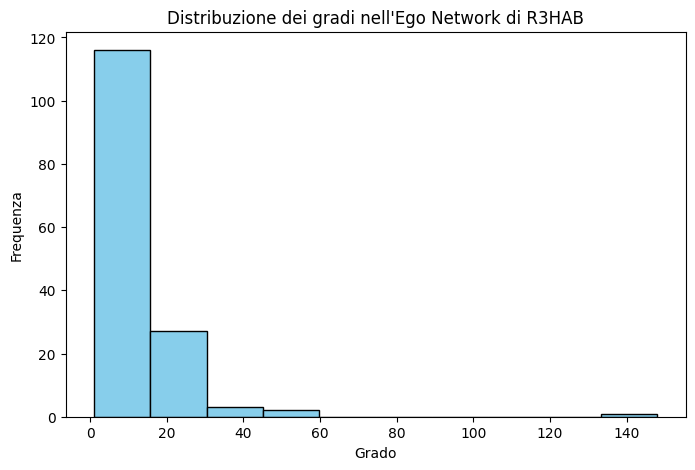

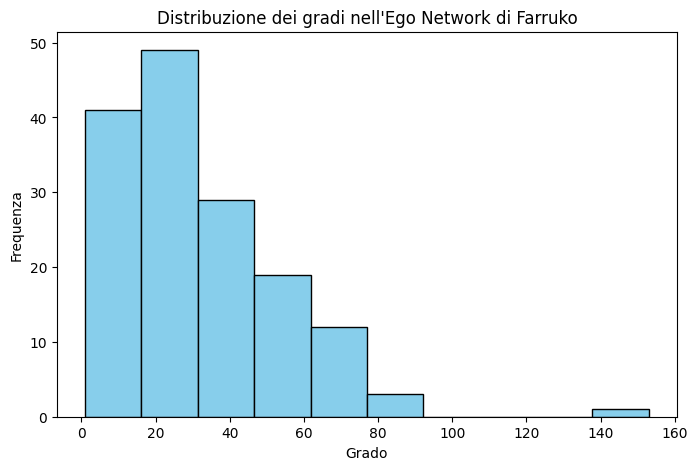

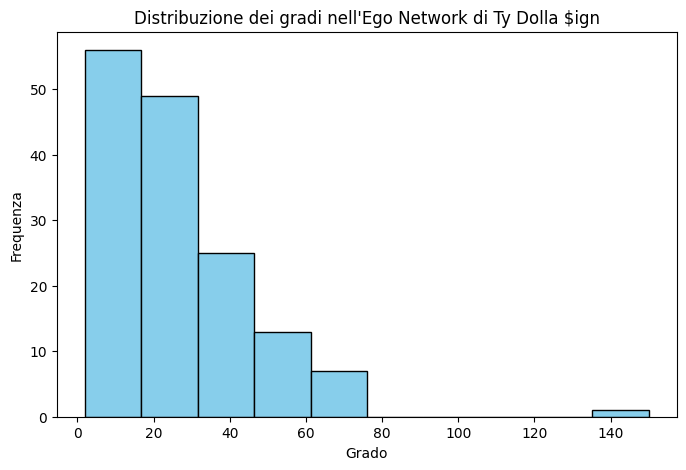

In [30]:
# Calcola la distribuzione del grado per ciascun ego network
def analyze_degree_distribution(ego_networks):
    for central_node, ego_net in ego_networks.items():
        degrees = dict(ego_net.degree())
        plt.figure(figsize=(8, 5))
        plt.hist(degrees.values(), bins=10, color='skyblue', edgecolor='black')
        plt.title(f"Distribuzione dei gradi nell'Ego Network di {central_node}")
        plt.xlabel("Grado")
        plt.ylabel("Frequenza")
        plt.show()

# Mappa i nomi degli artisti ai rispettivi spotify_id nel grafo G_top
name_to_id = {G_top.nodes[node]['name']: node for node in G_top.nodes()}

# Costruisce gli ego network per i nodi centrali (usando spotify_id)
ego_networks = {}
for name in nodes_of_interest:
    node_id = name_to_id.get(name)
    if node_id is not None:
        ego_networks[name] = nx.ego_graph(G_top, node_id)
    else:
        print(f"Artista '{name}' non trovato nel grafo.")

# Analizza la distribuzione dei gradi
analyze_degree_distribution(ego_networks)


**Caratterizzazione tematica**
Analizziamo i generi dei nodi nei vari ego network.

In [33]:
# Analisi dei generi musicali negli ego network
def analyze_genre_distribution(ego_networks):
    """
    Analizza la distribuzione dei generi musicali negli ego network.
    Per ogni ego network, conta i generi più frequenti tra gli artisti.
    """
    for central_node, ego_net in ego_networks.items():
        # Raccolta di tutti i generi negli ego network
        all_genres = []
        
        for node in ego_net.nodes():
            # Ottieni i generi dell'artista
            genres_str = G_top.nodes[node].get('genres', '')
            
            # Se i generi esistono e non sono nulli
            if genres_str and pd.notna(genres_str):
                # Converti la stringa in lista (se è in formato stringa)
                if isinstance(genres_str, str):
                    # Rimuovi parentesi quadre e apici, poi splitta per virgola
                    genres_str = genres_str.strip("[]").replace("'", "").replace('"', '')
                    genres_list = [g.strip() for g in genres_str.split(',') if g.strip()]
                    all_genres.extend(genres_list)
        
        # Conta i generi più frequenti
        if all_genres:
            genre_counts = Counter(all_genres)
            
            print(f"\n=== Analisi Generi per Ego Network di {central_node} ===")
            print(f"Totale generi unici: {len(genre_counts)}")
            print(f"\nTop 10 generi più frequenti:")
            for genre, count in genre_counts.most_common(10):
                percentage = (count / len(all_genres)) * 100
                print(f"  {genre}: {count} ({percentage:.1f}%)")
        else:
            print(f"\n=== Analisi Generi per Ego Network di {central_node} ===")
            print("Nessun genere trovato per questo ego network.")

# Analizza la distribuzione dei generi
analyze_genre_distribution(ego_networks)


=== Analisi Generi per Ego Network di R3HAB ===
Totale generi unici: 155

Top 10 generi più frequenti:
  dance pop: 74 (9.8%)
  pop dance: 61 (8.1%)
  edm: 60 (8.0%)
  pop: 58 (7.7%)
  tropical house: 44 (5.8%)
  electro house: 40 (5.3%)
  uk pop: 30 (4.0%)
  house: 19 (2.5%)
  progressive electro house: 19 (2.5%)
  progressive house: 18 (2.4%)

=== Analisi Generi per Ego Network di Farruko ===
Totale generi unici: 94

Top 10 generi più frequenti:
  trap latino: 91 (16.6%)
  reggaeton: 82 (15.0%)
  reggaeton flow: 52 (9.5%)
  latin hip hop: 42 (7.7%)
  dominican pop: 22 (4.0%)
  dance pop: 19 (3.5%)
  latin pop: 17 (3.1%)
  rap dominicano: 17 (3.1%)
  dembow: 15 (2.7%)
  pop: 13 (2.4%)

=== Analisi Generi per Ego Network di Ty Dolla $ign ===
Totale generi unici: 137

Top 10 generi più frequenti:
  rap: 84 (10.2%)
  pop rap: 65 (7.9%)
  hip hop: 60 (7.3%)
  trap: 57 (7.0%)
  pop: 49 (6.0%)
  dance pop: 46 (5.6%)
  southern hip hop: 46 (5.6%)
  gangster rap: 26 (3.2%)
  r&b: 25 (3.0%)
 

**Visualizzazione della sovrapposizione tra ego network**
Visualizziamo le connessioni condivise tra i diversi ego network.

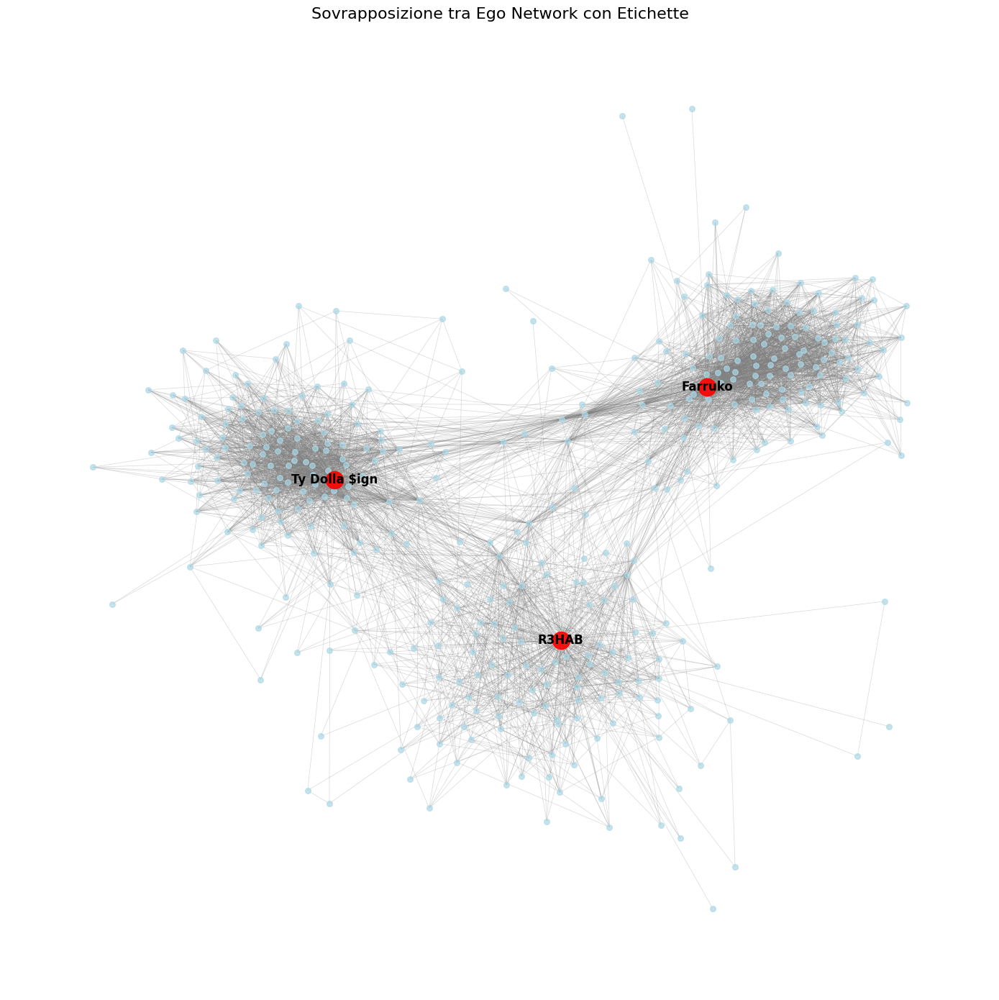


=== STATISTICHE SOVRAPPOSIZIONE ===
Totale nodi nel grafo combinato: 402
Totale archi nel grafo combinato: 5173
Densità del grafo combinato: 0.0642


In [34]:
# Visualizzazione della sovrapposizione tra ego network con etichette
def visualize_ego_overlap_with_labels(ego_networks, central_nodes):
    """
    Visualizza la sovrapposizione tra gli ego network dei nodi centrali.
    Etichetta solo i nodi centrali per maggiore chiarezza.
    """
    # Combina tutti gli ego network in un unico grafo
    combined_graph = nx.Graph()
    for ego_net in ego_networks.values():
        combined_graph = nx.compose(combined_graph, ego_net)

    plt.figure(figsize=(14, 14))
    pos = nx.spring_layout(combined_graph, seed=42, k=0.3)
    
    # Disegna tutti i nodi e archi
    nx.draw_networkx_edges(combined_graph, pos, edge_color='gray', alpha=0.3, width=0.5)
    nx.draw_networkx_nodes(combined_graph, pos, node_size=30, 
                          node_color='lightblue', alpha=0.7)

    # Mappa i nomi degli artisti agli ID per i nodi centrali
    name_to_id = {G_top.nodes[node]['name']: node for node in G_top.nodes()}
    central_node_ids = [name_to_id[name] for name in central_nodes if name in name_to_id]
    
    # Evidenzia i nodi centrali con dimensione maggiore e colore diverso
    if central_node_ids:
        nx.draw_networkx_nodes(combined_graph, pos, 
                              nodelist=central_node_ids,
                              node_size=300, 
                              node_color='red', 
                              alpha=0.9)
        
        # Aggiungi etichette solo per i nodi centrali con i nomi degli artisti
        labels = {node_id: G_top.nodes[node_id]['name'] 
                 for node_id in central_node_ids 
                 if node_id in combined_graph.nodes}
        nx.draw_networkx_labels(combined_graph, pos, labels, 
                               font_size=12, font_color='black', 
                               font_weight='bold')

    plt.title("Sovrapposizione tra Ego Network con Etichette", fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Statistiche sulla sovrapposizione
    print(f"\n=== STATISTICHE SOVRAPPOSIZIONE ===")
    print(f"Totale nodi nel grafo combinato: {combined_graph.number_of_nodes()}")
    print(f"Totale archi nel grafo combinato: {combined_graph.number_of_edges()}")
    print(f"Densità del grafo combinato: {nx.density(combined_graph):.4f}")

# Visualizza la sovrapposizione con etichette
visualize_ego_overlap_with_labels(ego_networks, nodes_of_interest)

In [35]:
# Identifica i nodi comuni nei diversi ego network
print("=== ANALISI SOVRAPPOSIZIONE TRA EGO NETWORK ===\n")

# Mappa i nomi agli ID
name_to_id = {G_top.nodes[node]['name']: node for node in G_top.nodes()}

# Crea dizionario con i nodi di ogni ego network
ego_nodes = {}
for name in nodes_of_interest:
    node_id = name_to_id.get(name)
    if node_id:
        ego_nodes[name] = set(nx.ego_graph(G_top, node_id, radius=1).nodes())

# Calcola l'intersezione tra ego network
overlaps = {}
for ego1, nodes1 in ego_nodes.items():
    for ego2, nodes2 in ego_nodes.items():
        if ego1 < ego2:  # Evita duplicati
            common_nodes = nodes1.intersection(nodes2)
            overlaps[f"{ego1} & {ego2}"] = common_nodes

# Visualizza i nodi comuni tra i network
for pair, common in overlaps.items():
    print(f"\nNodi comuni tra {pair}: {len(common)}")
    if len(common) > 0:
        print("Top 5 artisti in comune:")
        for i, node_id in enumerate(list(common)[:5], 1):
            artist_name = G_top.nodes[node_id]['name']
            artist_genres = G_top.nodes[node_id]['genres']
            print(f"  {i}. {artist_name} - Generi: {artist_genres}")

=== ANALISI SOVRAPPOSIZIONE TRA EGO NETWORK ===


Nodi comuni tra R3HAB & Ty Dolla $ign: 26
Top 5 artisti in comune:
  1. Nicki Minaj - Generi: ['dance pop', 'hip pop', 'pop', 'queens hip hop', 'rap']
  2. Tyga - Generi: ['dance pop', 'hip hop', 'pop rap', 'rap', 'southern hip hop', 'trap']
  3. Don Diablo - Generi: ['dance pop', 'edm', 'electro house', 'future house', 'house', 'pop dance', 'progressive electro house', 'progressive house', 'tropical house']
  4. Zara Larsson - Generi: ['dance pop', 'edm', 'electropop', 'pop', 'pop dance', 'post-teen pop', 'scandipop', 'swedish electropop', 'swedish pop', 'tropical house', 'uk pop']
  5. David Guetta - Generi: ['big room', 'dance pop', 'edm', 'pop', 'pop dance']

Nodi comuni tra Farruko & R3HAB: 20
Top 5 artisti in comune:
  1. Fuego - Generi: ['latin hip hop', 'rap dominicano', 'reggaeton', 'reggaeton flow', 'trap latino']
  2. Nicki Minaj - Generi: ['dance pop', 'hip pop', 'pop', 'queens hip hop', 'rap']
  3. DJ Snake - Generi: ['danc

## Analisi delle relazioni
Calcolo delle triadi e clique

=== ANALISI DELLE TRIADI ===
Triadi chiuse: 227,775
Triadi aperte: 674,909
Percentuale triadi chiuse: 25.23%
Coefficiente di clustering medio: 0.2795

=== ANALISI DELLE CLIQUE ===
Ricerca clique in corso...
Numero totale di clique: 28,826
Dimensione della clique più grande: 19

Primi 10 membri della clique più grande:
  1. Sukhwinder Singh
     Popularity: 66 | Generi: ['classic bollywood', 'desi hip hop', 'desi pop', 'filmi', 'modern bollywood']
  2. Arijit Singh
     Popularity: 86 | Generi: ['desi pop', 'filmi', 'modern bollywood']
  3. Benny Dayal
     Popularity: 68 | Generi: ['desi hip hop', 'desi pop', 'filmi', 'modern bollywood']
  4. Mika Singh
     Popularity: 65 | Generi: ['desi hip hop', 'desi pop', 'filmi', 'modern bollywood']
  5. Neeti Mohan
     Popularity: 71 | Generi: ['desi pop', 'filmi', 'modern bollywood']
  6. Badshah
     Popularity: 73 | Generi: ['desi hip hop', 'desi pop', 'desi trap', 'haryanvi pop', 'modern bollywood']
  7. KK
     Popularity: 73 | Generi: ['

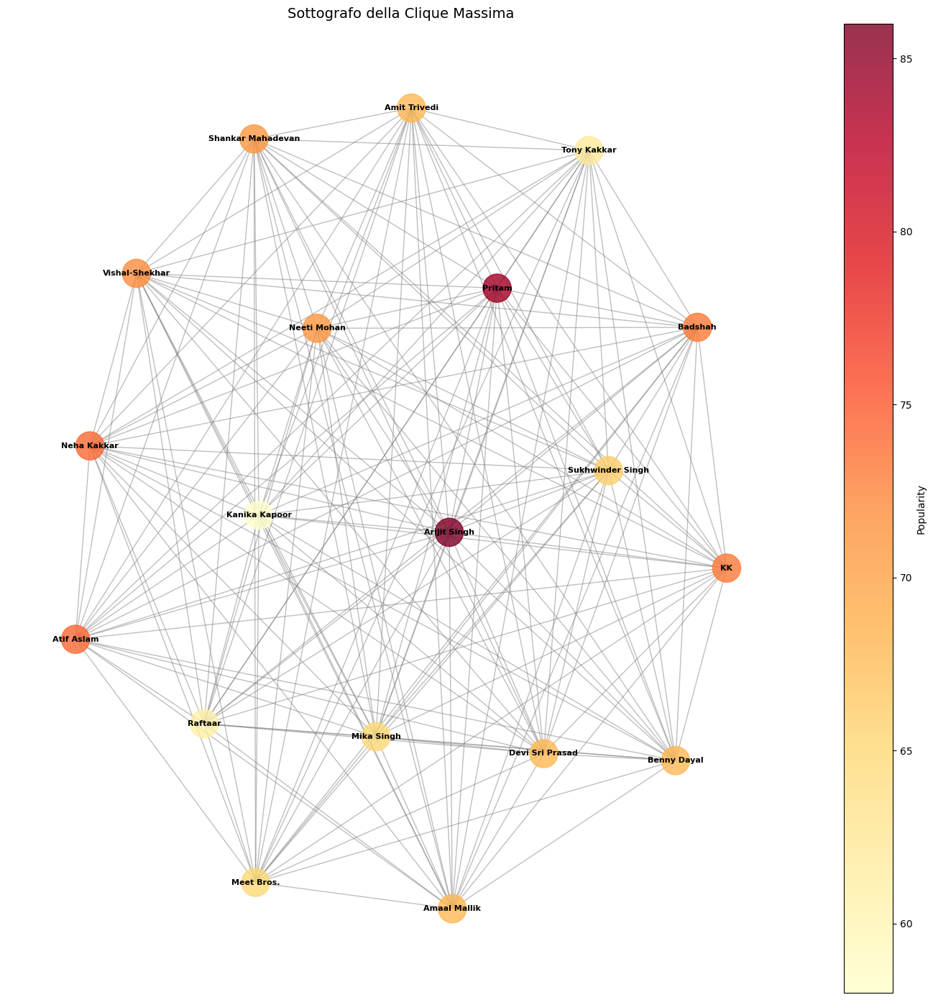

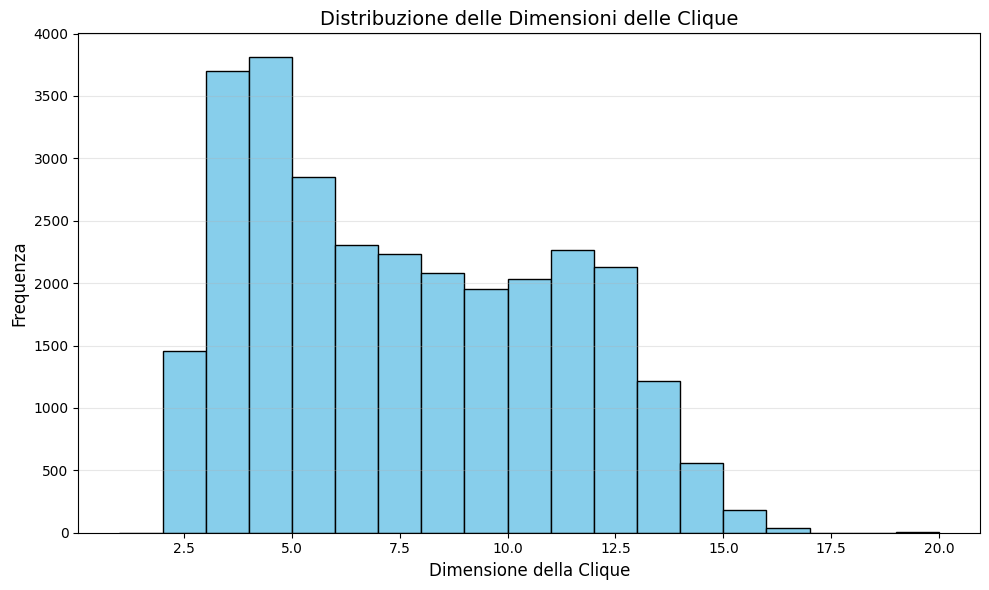


Densità del sottografo della clique massima: 1.0000


In [38]:
# Conta il numero totale di triadi
def count_triad_types(G):
    triad_types = {
        'closed': 0,   # Tutte e tre le connessioni esistono
        'open': 0      # Almeno una connessione mancante
    }
    
    for node in G.nodes():
        # Prendi tutti i vicini del nodo
        neighbors = list(G.neighbors(node))
        
        # Controlla tutte le possibili combinazioni di 2 vicini
        for n1, n2 in itertools.combinations(neighbors, 2):
            if G.has_edge(n1, n2):
                triad_types['closed'] += 1
            else:
                triad_types['open'] += 1
    
    return triad_types

# Analisi delle triadi
triad_analysis = count_triad_types(G_top)
print("=== ANALISI DELLE TRIADI ===")
print(f"Triadi chiuse: {triad_analysis['closed']:,}")
print(f"Triadi aperte: {triad_analysis['open']:,}")
total_triads = triad_analysis['closed'] + triad_analysis['open']
if total_triads > 0:
    print(f"Percentuale triadi chiuse: {triad_analysis['closed']/total_triads*100:.2f}%")

# Calcolo del coefficiente di clustering medio
clustering_coefficient = nx.average_clustering(G_top)
print(f"Coefficiente di clustering medio: {clustering_coefficient:.4f}")

# Trova tutte le clique massimali nel grafo
print("\n=== ANALISI DELLE CLIQUE ===")
print("Ricerca clique in corso...")
all_cliques = list(nx.find_cliques(G_top))
print(f"Numero totale di clique: {len(all_cliques):,}")

# Determina la clique massima
largest_clique = max(all_cliques, key=len)
print(f"Dimensione della clique più grande: {len(largest_clique)}")

# Mostra i primi 10 membri della clique più grande con i nomi degli artisti
print("\nPrimi 10 membri della clique più grande:")
for i, node_id in enumerate(largest_clique[:10], 1):
    artist_name = G_top.nodes[node_id]['name']
    artist_genres = G_top.nodes[node_id].get('genres', 'N/A')
    artist_popularity = G_top.nodes[node_id].get('popularity', 'N/A')
    print(f"  {i}. {artist_name}")
    print(f"     Popularity: {artist_popularity} | Generi: {artist_genres}")

# Visualizza il sottografo della clique massima (solo se <= 30 nodi)
if len(largest_clique) <= 30:
    G_clique = G_top.subgraph(largest_clique)

    plt.figure(figsize=(14, 14))
    pos = nx.spring_layout(G_clique, seed=42)
    
    # Crea labels con i nomi degli artisti
    labels = {node_id: G_top.nodes[node_id]['name'] for node_id in G_clique.nodes}
    
    # Colora i nodi in base alla popularity
    node_colors = [G_top.nodes[node_id]['popularity'] for node_id in G_clique.nodes]
    
    nodes = nx.draw_networkx_nodes(
        G_clique, pos,
        node_size=800,
        node_color=node_colors,
        cmap='YlOrRd',
        alpha=0.8
    )
    
    nx.draw_networkx_edges(G_clique, pos, edge_color='gray', alpha=0.5)
    nx.draw_networkx_labels(G_clique, pos, labels, font_size=8, font_weight='bold')
    
    plt.colorbar(nodes, label='Popularity')
    plt.title("Sottografo della Clique Massima", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print(f"\nClique troppo grande per la visualizzazione ({len(largest_clique)} nodi)")

# Distribuzione delle dimensioni delle clique
clique_sizes = [len(clique) for clique in all_cliques]
plt.figure(figsize=(10, 6))
plt.hist(clique_sizes, bins=range(1, min(max(clique_sizes)+2, 50)), 
         color='skyblue', edgecolor='black')
plt.xlabel("Dimensione della Clique", fontsize=12)
plt.ylabel("Frequenza", fontsize=12)
plt.title("Distribuzione delle Dimensioni delle Clique", fontsize=14)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Calcolo della densità del sottografo della clique massima
G_clique_full = G_top.subgraph(largest_clique)
clique_density = nx.density(G_clique_full)
print(f"\nDensità del sottografo della clique massima: {clique_density:.4f}")


## K-CORE 

ANALISI K-CORE DECOMPOSITION

=== CARATTERISTICHE DEL K-CORE PRINCIPALE ===
Numero di nodi: 64
Numero di archi: 1300
K-value (grado minimo): 29
Percentuale nodi sul totale: 3.34%
Densità del k-core: 0.6448

Densità rete originale: 0.0118
Incremento densità: 5344.54%

=== VISUALIZZAZIONE K-CORE ===


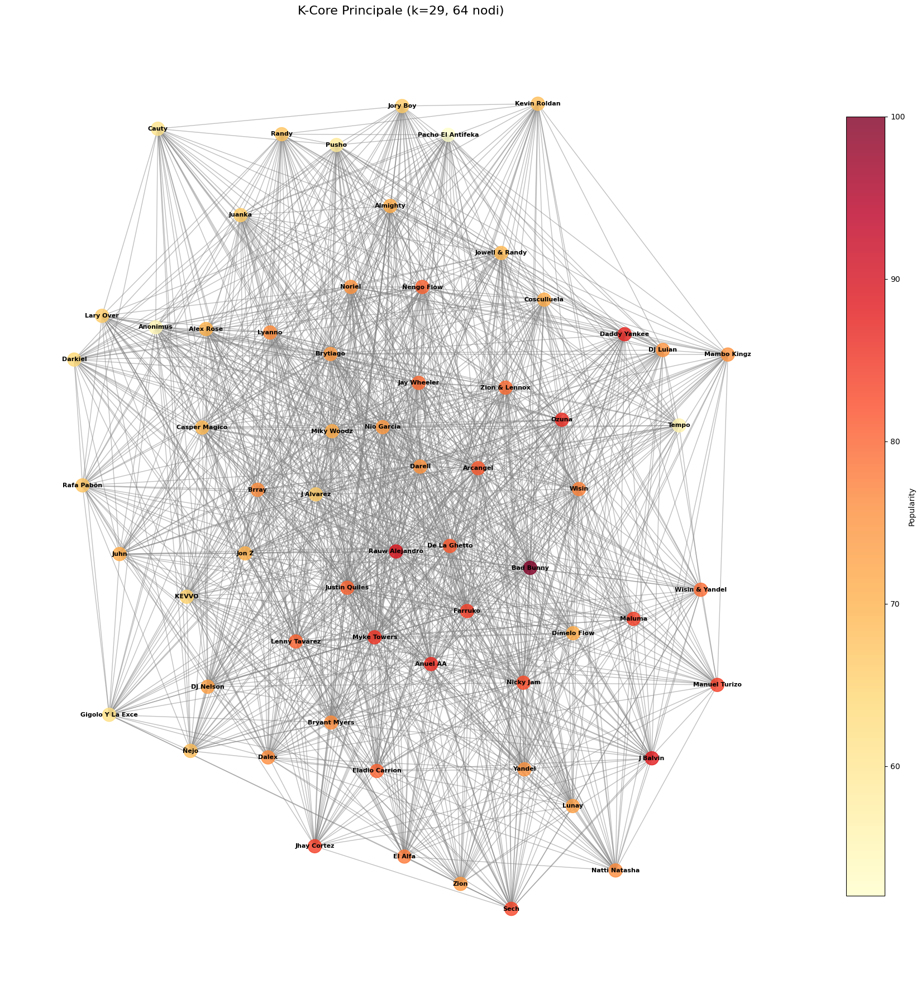


=== DISTRIBUZIONE DEI GRADI NEL K-CORE ===


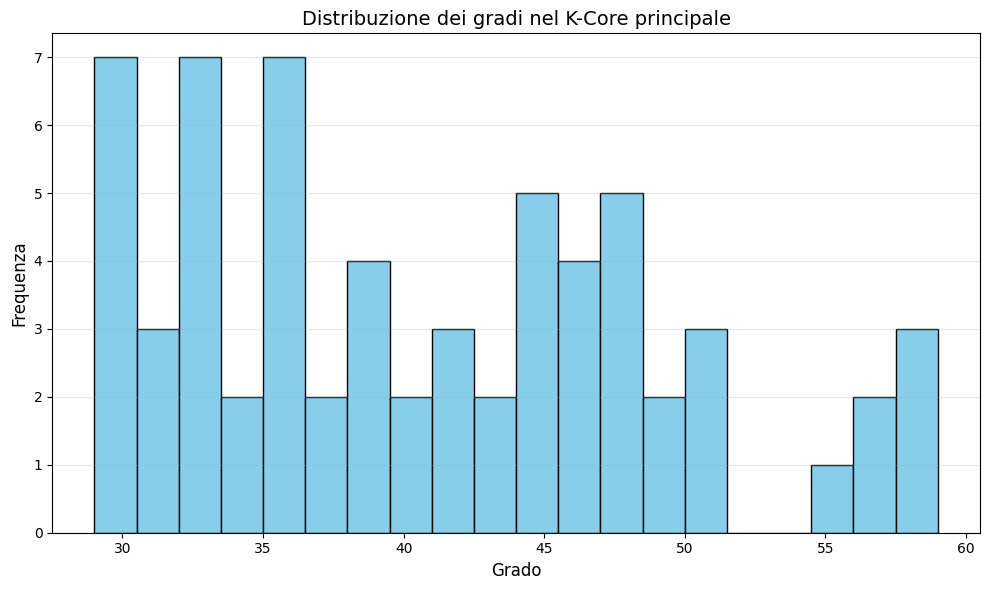

Grado medio: 40.62
Grado massimo: 59 - Artista: Arcangel
Grado minimo: 29 - Artista: Kevin Roldan

=== CENTRALITÀ DEI NODI NEL K-CORE ===

Top 10 artisti per Degree Centrality nel K-Core:
  1. Arcangel: 0.9365
     Generi: ['latin hip hop', 'reggaeton', 'trap latino']
  2. Myke Towers: 0.9365
     Generi: ['reggaeton', 'trap latino']
  3. Rauw Alejandro: 0.9206
     Generi: ['puerto rican pop', 'trap latino']
  4. De La Ghetto: 0.9048
     Generi: ['latin hip hop', 'reggaeton', 'reggaeton flow', 'trap latino']
  5. Darell: 0.8889
     Generi: ['latin hip hop', 'reggaeton', 'reggaeton flow', 'trap latino']
  6. Farruko: 0.8730
     Generi: ['latin hip hop', 'reggaeton', 'trap latino']
  7. Miky Woodz: 0.7937
     Generi: ['latin hip hop', 'reggaeton', 'reggaeton flow', 'trap latino']
  8. Noriel: 0.7937
     Generi: ['latin hip hop', 'reggaeton', 'reggaeton flow', 'trap latino']
  9. Nio Garcia: 0.7937
     Generi: ['latin hip hop', 'reggaeton', 'trap latino']
  10. Anuel AA: 0.7778
   

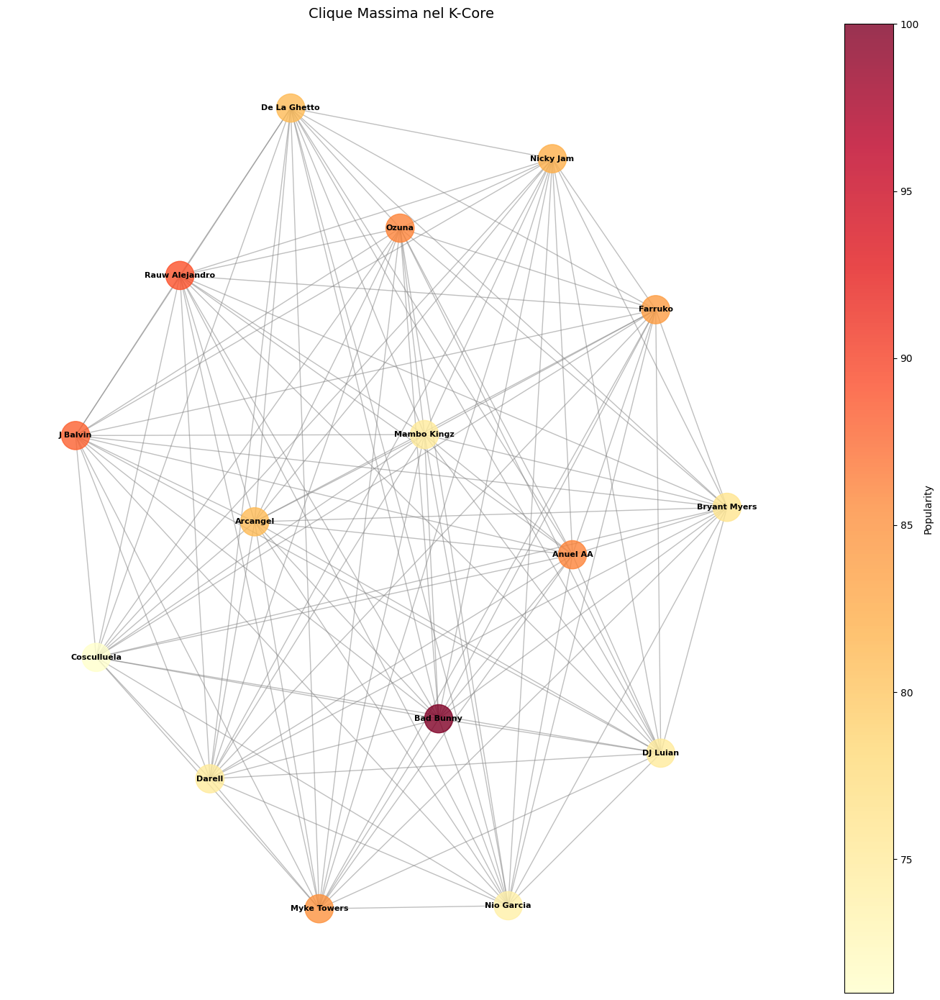


=== ANALISI GENERI NEL K-CORE ===
Totale generi unici nel k-core: 19

Top 15 generi più frequenti nel k-core:
  trap latino: 63 (28.1%)
  reggaeton: 61 (27.2%)
  reggaeton flow: 40 (17.9%)
  latin hip hop: 30 (13.4%)
  perreo: 8 (3.6%)
  reggaeton colombiano: 4 (1.8%)
  latin pop: 3 (1.3%)
  trap boricua: 3 (1.3%)
  puerto rican pop: 2 (0.9%)
  rap latina: 1 (0.4%)
  colombian pop: 1 (0.4%)
  dembow: 1 (0.4%)
  rap dominicano: 1 (0.4%)
  dominican pop: 1 (0.4%)
  r&b en espanol: 1 (0.4%)

ANALISI K-CORE COMPLETATA


In [39]:
# Analisi K-Core Decomposition
def analyze_k_core(G):
    """
    Analisi completa della decomposizione k-core del grafo.
    Identifica il nucleo più denso della rete e analizza le sue proprietà.
    """
    print("="*60)
    print("ANALISI K-CORE DECOMPOSITION")
    print("="*60)
    
    # Calcola il k-core principale
    k_cores = nx.k_core(G)
    
    # Trova la componente connessa più grande del k-core
    if len(k_cores.nodes()) > 0:
        largest_k_core_cc = max(nx.connected_components(k_cores), key=len)
        main_core = k_cores.subgraph(largest_k_core_cc).copy()
    else:
        print("Nessun k-core trovato nel grafo.")
        return
    
    # Parametri principali
    main_core_size = len(main_core.nodes())
    k_value = min(dict(main_core.degree()).values())  # k-value minimo
    
    print(f"\n=== CARATTERISTICHE DEL K-CORE PRINCIPALE ===")
    print(f"Numero di nodi: {main_core_size}")
    print(f"Numero di archi: {main_core.number_of_edges()}")
    print(f"K-value (grado minimo): {k_value}")
    print(f"Percentuale nodi sul totale: {(main_core_size/G.number_of_nodes())*100:.2f}%")
    
    # Densità del k-core
    density = nx.density(main_core)
    print(f"Densità del k-core: {density:.4f}")
    
    # Confronto con la rete originale
    print(f"\nDensità rete originale: {nx.density(G):.4f}")
    print(f"Incremento densità: {((density/nx.density(G))-1)*100:.2f}%")
    
    # =============================
    # VISUALIZZAZIONE K-CORE CON NOMI
    # =============================
    print("\n=== VISUALIZZAZIONE K-CORE ===")
    
    # Se il k-core ha troppi nodi, mostra solo i top per centralità con etichette
    if main_core_size > 100:
        print(f"Il k-core ha {main_core_size} nodi, verranno etichettati solo i top 20 per degree centrality")
        
        # Calcola degree centrality per identificare i nodi più importanti
        core_degree_cent = nx.degree_centrality(main_core)
        top_nodes = sorted(core_degree_cent.items(), key=lambda x: x[1], reverse=True)[:20]
        top_node_ids = [node_id for node_id, _ in top_nodes]
        
        plt.figure(figsize=(18, 18))
        pos = nx.spring_layout(main_core, seed=42, k=0.3)
        
        # Colora i nodi in base alla popularity
        node_colors = [G.nodes[node]['popularity'] for node in main_core.nodes()]
        
        nodes = nx.draw_networkx_nodes(
            main_core, pos,
            node_size=50,
            node_color=node_colors,
            cmap='YlOrRd',
            alpha=0.8
        )
        nx.draw_networkx_edges(main_core, pos, edge_color='gray', alpha=0.4, width=0.5)
        
        # Etichetta solo i top 20 nodi
        labels = {node_id: G.nodes[node_id]['name'] for node_id in top_node_ids}
        nx.draw_networkx_labels(main_core, pos, labels, font_size=9, 
                               font_weight='bold', font_color='black')
        
        plt.colorbar(nodes, label='Popularity', shrink=0.8)
        plt.title(f"K-Core Principale (k={k_value}, {main_core_size} nodi)\nEtichette: Top 20 per Degree Centrality", 
                 fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        # Se il k-core è piccolo, mostra tutti i nomi
        plt.figure(figsize=(18, 18))
        pos = nx.spring_layout(main_core, seed=42, k=0.5)
        
        # Colora i nodi in base alla popularity
        node_colors = [G.nodes[node]['popularity'] for node in main_core.nodes()]
        
        # Crea labels con i nomi degli artisti
        labels = {node_id: G.nodes[node_id]['name'] for node_id in main_core.nodes()}
        
        nodes = nx.draw_networkx_nodes(
            main_core, pos,
            node_size=300,
            node_color=node_colors,
            cmap='YlOrRd',
            alpha=0.8
        )
        nx.draw_networkx_edges(main_core, pos, edge_color='gray', alpha=0.5, width=1)
        nx.draw_networkx_labels(main_core, pos, labels, font_size=8, 
                               font_weight='bold', font_color='black')
        
        plt.colorbar(nodes, label='Popularity', shrink=0.8)
        plt.title(f"K-Core Principale (k={k_value}, {main_core_size} nodi)", fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    # =============================
    # DISTRIBUZIONE DEI GRADI
    # =============================
    print("\n=== DISTRIBUZIONE DEI GRADI NEL K-CORE ===")
    
    degrees = [main_core.degree(n) for n in main_core.nodes()]
    
    plt.figure(figsize=(10, 6))
    plt.hist(degrees, bins=20, color='skyblue', edgecolor='black')
    plt.title("Distribuzione dei gradi nel K-Core principale", fontsize=14)
    plt.xlabel("Grado", fontsize=12)
    plt.ylabel("Frequenza", fontsize=12)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Statistiche sui gradi
    max_degree_node = max(main_core.degree, key=lambda x: x[1])
    min_degree_node = min(main_core.degree, key=lambda x: x[1])
    
    print(f"Grado medio: {np.mean(degrees):.2f}")
    print(f"Grado massimo: {max_degree_node[1]} - Artista: {G.nodes[max_degree_node[0]]['name']}")
    print(f"Grado minimo: {min_degree_node[1]} - Artista: {G.nodes[min_degree_node[0]]['name']}")
    
    # =============================
    # CENTRALITÀ NEL K-CORE
    # =============================
    print("\n=== CENTRALITÀ DEI NODI NEL K-CORE ===")
    
    degree_centrality = nx.degree_centrality(main_core)
    betweenness_centrality = nx.betweenness_centrality(main_core)
    closeness_centrality = nx.closeness_centrality(main_core)
    
    top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
    top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
    top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
    
    print("\nTop 10 artisti per Degree Centrality nel K-Core:")
    for i, (node_id, value) in enumerate(top_degree, 1):
        artist_name = G.nodes[node_id]['name']
        artist_genres = G.nodes[node_id].get('genres', 'N/A')
        print(f"  {i}. {artist_name}: {value:.4f}")
        print(f"     Generi: {artist_genres}")
    
    print("\nTop 10 artisti per Betweenness Centrality nel K-Core:")
    for i, (node_id, value) in enumerate(top_betweenness, 1):
        artist_name = G.nodes[node_id]['name']
        artist_genres = G.nodes[node_id].get('genres', 'N/A')
        print(f"  {i}. {artist_name}: {value:.4f}")
        print(f"     Generi: {artist_genres}")
    
    print("\nTop 10 artisti per Closeness Centrality nel K-Core:")
    for i, (node_id, value) in enumerate(top_closeness, 1):
        artist_name = G.nodes[node_id]['name']
        artist_genres = G.nodes[node_id].get('genres', 'N/A')
        print(f"  {i}. {artist_name}: {value:.4f}")
        print(f"     Generi: {artist_genres}")
    
    # =============================
    # ANALISI CLIQUE NEL K-CORE
    # =============================
    print("\n=== ANALISI CLIQUE NEL K-CORE ===")
    
    cliques = list(nx.find_cliques(main_core))
    largest_clique = max(cliques, key=len) if cliques else []
    
    print(f"Numero totale di clique nel k-core: {len(cliques)}")
    print(f"Dimensione della clique più grande: {len(largest_clique)}")
    
    if len(largest_clique) > 0:
        print("\nPrimi 10 membri della clique più grande nel k-core:")
        for i, node_id in enumerate(largest_clique[:10], 1):
            artist_name = G.nodes[node_id]['name']
            artist_genres = G.nodes[node_id].get('genres', 'N/A')
            popularity = G.nodes[node_id].get('popularity', 'N/A')
            print(f"  {i}. {artist_name}")
            print(f"     Popularity: {popularity} | Generi: {artist_genres}")
        
        # Visualizzazione clique massima (solo se <= 30 nodi)
        if len(largest_clique) <= 30:
            G_clique = main_core.subgraph(largest_clique)
            
            plt.figure(figsize=(14, 14))
            pos_clique = nx.spring_layout(G_clique, seed=42)
            
            # Labels con nomi artisti
            labels = {node_id: G.nodes[node_id]['name'] for node_id in G_clique.nodes}
            
            # Colori basati su popularity
            node_colors_clique = [G.nodes[node_id]['popularity'] for node_id in G_clique.nodes]
            
            nodes_clique = nx.draw_networkx_nodes(
                G_clique, pos_clique,
                node_size=800,
                node_color=node_colors_clique,
                cmap='YlOrRd',
                alpha=0.8
            )
            
            nx.draw_networkx_edges(G_clique, pos_clique, edge_color='gray', alpha=0.5)
            nx.draw_networkx_labels(G_clique, pos_clique, labels, font_size=8, font_weight='bold')
            
            plt.colorbar(nodes_clique, label='Popularity')
            plt.title("Clique Massima nel K-Core", fontsize=14)
            plt.axis('off')
            plt.tight_layout()
            plt.show()
        else:
            print(f"\nClique troppo grande per visualizzazione ({len(largest_clique)} nodi)")
    
    # =============================
    # ANALISI GENERI NEL K-CORE
    # =============================
    print("\n=== ANALISI GENERI NEL K-CORE ===")
    
    all_genres_core = []
    for node in main_core.nodes():
        genres_str = G.nodes[node].get('genres', '')
        
        if genres_str and pd.notna(genres_str):
            if isinstance(genres_str, str):
                genres_str = genres_str.strip("[]").replace("'", "").replace('"', '')
                genres_list = [g.strip() for g in genres_str.split(',') if g.strip()]
                all_genres_core.extend(genres_list)
    
    if all_genres_core:
        genre_counts_core = Counter(all_genres_core)
        
        print(f"Totale generi unici nel k-core: {len(genre_counts_core)}")
        print(f"\nTop 15 generi più frequenti nel k-core:")
        for genre, count in genre_counts_core.most_common(15):
            percentage = (count / len(all_genres_core)) * 100
            print(f"  {genre}: {count} ({percentage:.1f}%)")
    
    print("\n" + "="*60)
    print("ANALISI K-CORE COMPLETATA")
    print("="*60)
    
    return main_core

# Esegui l'analisi completa del k-core su G_top
main_k_core = analyze_k_core(G_top)